<center><p float="center">
  <img src="https://upload.wikimedia.org/wikipedia/commons/e/e9/4_RGB_McCombs_School_Brand_Branded.png" width="300" height="100"/>
  <img src="https://mma.prnewswire.com/media/1458111/Great_Learning_Logo.jpg?p=facebook" width="200" height="100"/>
</p></center>

<h1><center><font size=10>Artificial Intelligence and Machine Learning</center></font></h1>
<h1><center>Credit Card Users Churn Prediction</center></h1>

### Description

### Context
The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.



### Objective
Customers’ leaving credit card services would lead the bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and the reason for same – so that the bank could improve upon those areas.

You as a Data Scientist at Thera Bank need to explore the data provided, identify patterns, and come up with a classification model to identify customers likely to churn, and provide actionable insights and recommendations that will help the bank improve its services so that customers do not renounce their credit cards.



### Data Description
* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: The gender of the account holder
* Dependent_count: Number of dependents
* Education_Level:  Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank
* Total_Relationship_Count: Total no. of products held by the customer
Months_Inactive_12_mon: No. of months inactive in the last 12 months
Contacts_Count_12_mon: No. of Contacts between the customer and bank in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: The balance that carries over from one month to the next is the revolving balance
* Avg_Open_To_Buy: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Ratio of the total transaction count in 4th quarter and the total transaction count in the 1st quarter
* Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in 4th quarter and the total transaction amount in the 1st quarter
* Avg_Utilization_Ratio: Represents how much of the available credit the customer spent

In [1]:
# Importing all required library
# To help with reading and manipulating data
import pandas as pd
import numpy as np

# To help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for missing value imputation
from sklearn.impute import SimpleImputer

# To help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

import lightgbm as lgb

from sklearn.dummy import DummyClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
    RocCurveDisplay,
)

# To be used for data scaling and encoding
from sklearn.preprocessing import (
    StandardScaler,
    MinMaxScaler,
    OneHotEncoder,
    RobustScaler,
)
from sklearn.impute import SimpleImputer

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.base import TransformerMixin

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)


from tabulate import tabulate

# To supress warnings
import warnings

# date time
from datetime import datetime

warnings.filterwarnings("ignore")


In [3]:
#read the data file
churn_df=pd.read_csv('BankChurners.csv')
churn_df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [4]:
#shape of data
churn_df.shape

(10127, 21)

#### Observation:
* There are 10127 rows and 21 column .

In [5]:
# Create a copy of original data
data=churn_df.copy()

In [6]:
# Checking info regarding different columns of data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

#### Observation:

* There  are 15 numerical and 6 object type column
* We can see Education_Level and Maritial_Status have less than 10127 records so it means have some missing values

In [7]:
# Checking duplicated values
data.duplicated().sum()

0

#### Observation:

* There are no duplicate values

In [8]:
# Checking null values
data.isnull().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

#### Observation:

* There are 1519 and 749 missing values in Education_level and Martial_Status column respectively

In [9]:
# Checking percentage of missing values
round(data.isnull().sum()/len(data)*100,2)


CLIENTNUM                    0.0
Attrition_Flag               0.0
Customer_Age                 0.0
Gender                       0.0
Dependent_count              0.0
Education_Level             15.0
Marital_Status               7.4
Income_Category              0.0
Card_Category                0.0
Months_on_book               0.0
Total_Relationship_Count     0.0
Months_Inactive_12_mon       0.0
Contacts_Count_12_mon        0.0
Credit_Limit                 0.0
Total_Revolving_Bal          0.0
Avg_Open_To_Buy              0.0
Total_Amt_Chng_Q4_Q1         0.0
Total_Trans_Amt              0.0
Total_Trans_Ct               0.0
Total_Ct_Chng_Q4_Q1          0.0
Avg_Utilization_Ratio        0.0
dtype: float64

In [10]:
# checking unique values of categorical columns
for i in data.select_dtypes(include='object').columns:
  print(f'Unique values in column {i} are: {data[i].unique()}')


Unique values in column Attrition_Flag are: ['Existing Customer' 'Attrited Customer']
Unique values in column Gender are: ['M' 'F']
Unique values in column Education_Level are: ['High School' 'Graduate' 'Uneducated' nan 'College' 'Post-Graduate'
 'Doctorate']
Unique values in column Marital_Status are: ['Married' 'Single' nan 'Divorced']
Unique values in column Income_Category are: ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'abc']
Unique values in column Card_Category are: ['Blue' 'Gold' 'Silver' 'Platinum']


### Observation:
* In Education_Level Marital_Status we can see nan  we need to treat them .
* We can see abc in Income_Category which doesn't seems correct we need to treat them .

In [11]:
# Unique value for Numerical columns
data.select_dtypes(include='number').nunique()

CLIENTNUM                   10127
Customer_Age                   45
Dependent_count                 6
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

#### Observation:
* Age is just have 45 unique values means most of the customer are of similar age

In [12]:
# Statistical summaary of data
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


#### Observation:
>- Mean value for the `Customer Age` column is approx 46 and the median is also 46. This shows that majority of the customers are under 46 years of age.
>- `Dependent Count` column has mean and median of `~2`
>- `Months on Book` column has mean and median of `36` months. `Minimum` value is 13 months, showing that the dataset captures data for customers with the bank at least 1 whole years
>- `Total Relationship Count` has mean and median of `~4`
>- `Credit Limit` has a wide range of `1.4K to 34.5K`, the median being `4.5K`, way less than the mean `8.6K`
>- `Total Transaction Count` has mean of `~65` and median of `67`

In [13]:
#  prints unique value counts and percentages for the category/object type variables

def unique_val_counts(df):
  for col in df.select_dtypes(include='object'):
    print(f'For column: {col}')
    print(df[col].value_counts())
    print(df[col].value_counts(normalize=True)*100)
    print('\n')

unique_val_counts(data)


For column: Attrition_Flag
Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64
Attrition_Flag
Existing Customer    83.934038
Attrited Customer    16.065962
Name: proportion, dtype: float64


For column: Gender
Gender
F    5358
M    4769
Name: count, dtype: int64
Gender
F    52.908068
M    47.091932
Name: proportion, dtype: float64


For column: Education_Level
Education_Level
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64
Education_Level
Graduate         36.338290
High School      23.385223
Uneducated       17.274628
College          11.768123
Post-Graduate     5.994424
Doctorate         5.239312
Name: proportion, dtype: float64


For column: Marital_Status
Marital_Status
Married     4687
Single      3943
Divorced     748
Name: count, dtype: int64
Marital_Status
Married     49.978673
Single      42.045212
Divorced     7.976114
Name: pro

#### Observation:
>- The target variable `Attrition Flag` has `Existing to Attrited ratio` of `83.9 : 16.1`. There is imbalance in the dataset
>- `~93%` customers are having `Blue Card`
>- `Income Category` has a value `abc` for `10%` records, which we'll change to `Unknown`

In [14]:
#Drop the CLIENTNUM column

data = data.drop(['CLIENTNUM'], axis=1)


In [15]:
#replace  na values in Education_level and maritaial_status  as Unknown
data['Education_Level'] = data['Education_Level'].fillna('Unknown')
data['Marital_Status'] = data['Marital_Status'].fillna('Unknown')


In [16]:
# Treat abc value in Income_category as Unknown

data['Income_Category'] = data['Income_Category'].replace('abc', 'Unknown')


In [17]:
# Check unique values of catogrical column now
unique_val_counts(data)

For column: Attrition_Flag
Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64
Attrition_Flag
Existing Customer    83.934038
Attrited Customer    16.065962
Name: proportion, dtype: float64


For column: Gender
Gender
F    5358
M    4769
Name: count, dtype: int64
Gender
F    52.908068
M    47.091932
Name: proportion, dtype: float64


For column: Education_Level
Education_Level
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64
Education_Level
Graduate         30.887726
High School      19.877555
Unknown          14.999506
Uneducated       14.683519
College          10.002962
Post-Graduate     5.095290
Doctorate         4.453441
Name: proportion, dtype: float64


For column: Marital_Status
Marital_Status
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: count, dtype: int64
Marital_Status
Married  

### Converting Data Types to category

In [18]:
category_columns = data.select_dtypes(include="object").columns.tolist()
data[category_columns] = data[category_columns].astype("category")

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  category
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  category
 3   Dependent_count           10127 non-null  int64   
 4   Education_Level           10127 non-null  category
 5   Marital_Status            10127 non-null  category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  int64   
 10  Months_Inactive_12_mon    10127 non-null  int64   
 11  Contacts_Count_12_mon     10127 non-null  int64   
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

## Exploratory Data Analysis

In [20]:
def plot_hist_box_pot(data,x):
   fig = plt.figure(figsize=(16, 8))
   plt.subplots_adjust(hspace=0.6)
   plt.subplot(221, frameon=True)
   plt.title(f"{x.capitalize()} Density Distribution")
   ax1 = sns.distplot(data[x], color="purple")
   plt.subplot(222, frameon=True)
   ax2 = sns.boxplot(
        x=data[x], palette="cool", width=0.7, linewidth=0.6, showmeans=True
    )
   plt.title(f"{x.capitalize()} Boxplot")
   plt.show()

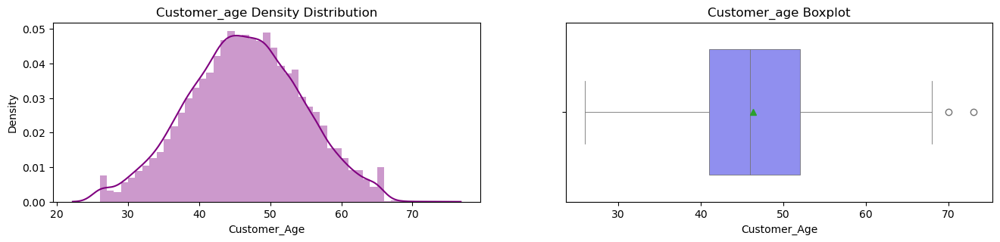

In [21]:
plot_hist_box_pot(data,'Customer_Age')

### Observation:
> Age is normally distributed with only two outlier at right side

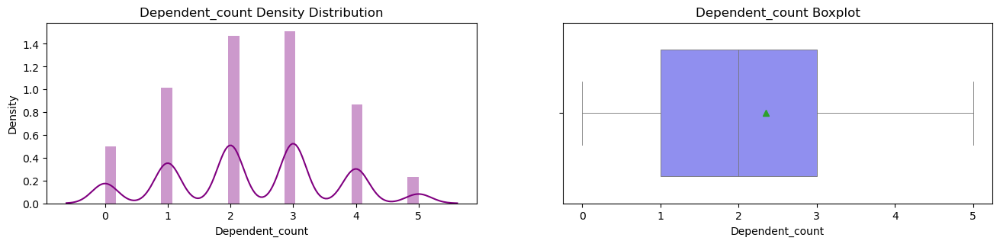

In [22]:
plot_hist_box_pot(data,'Dependent_count')

### Observation:
> Dependent are mostly 2 and 3

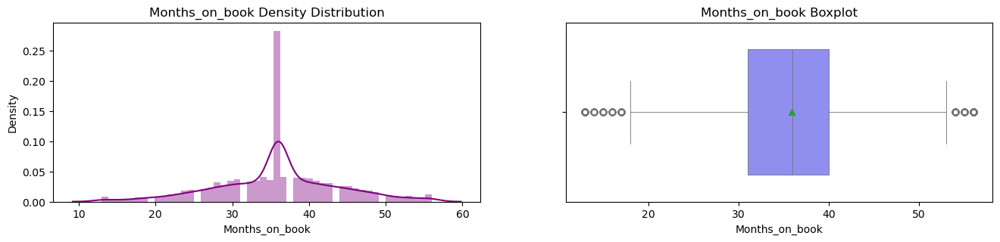

In [23]:
plot_hist_box_pot(data,'Months_on_book')

### Observation:
>  Most customers are on the books for `3 years`
> There are outliers on both lower and higher end

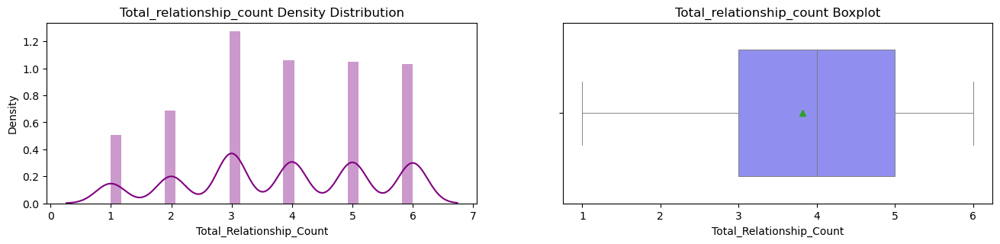

In [24]:
plot_hist_box_pot(data,'Total_Relationship_Count')

### Observation:
> Most of the customers have `4 or more` relations with the bank

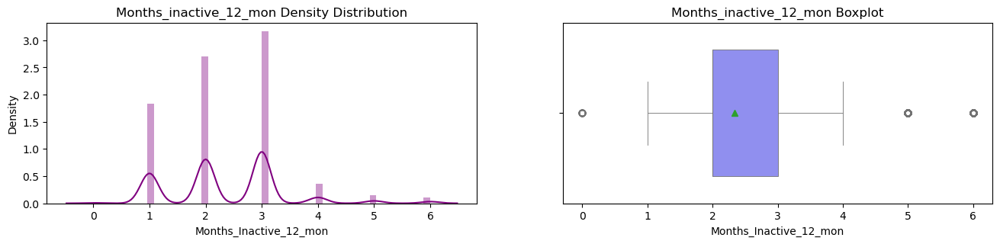

In [25]:
plot_hist_box_pot(data,'Months_Inactive_12_mon')

### Observation:
> Most of the customers were inactive for `2 months` in last 12 months
> There are outliers on the higher end

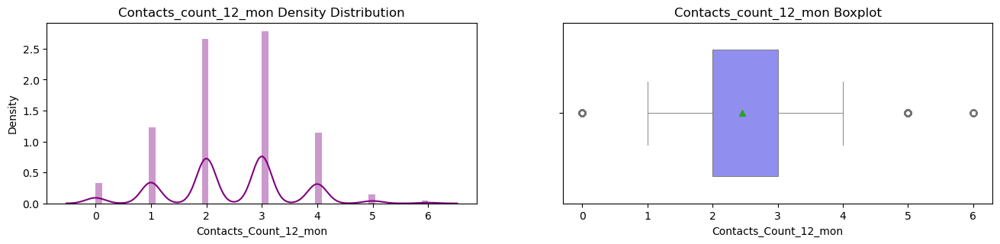

In [26]:
plot_hist_box_pot(data,'Contacts_Count_12_mon')


### Observation:
> Again lower and higher end outliers are noticed.

> Here less number of contacts between the bank and the customer should be interesting to be checked

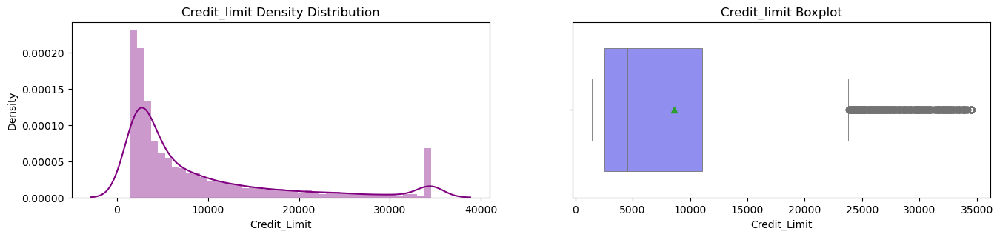

In [27]:
plot_hist_box_pot(data,'Credit_Limit')

### Observation:
> There are higher end outliers in `Credit Limit`. This might be because the customers are high end.

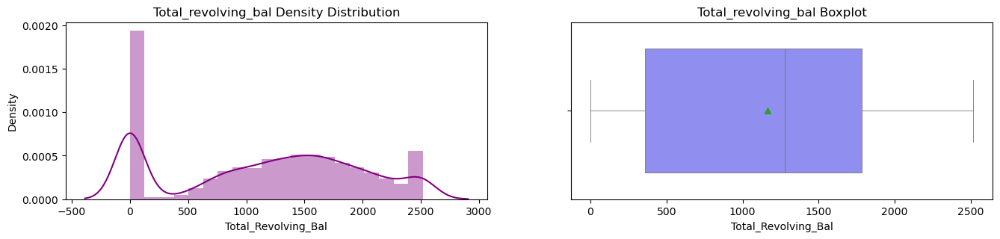

In [28]:
plot_hist_box_pot(data,'Total_Revolving_Bal')

### Observation:
> `Total revolving balance` of 0 would mean the customer never uses the credit card

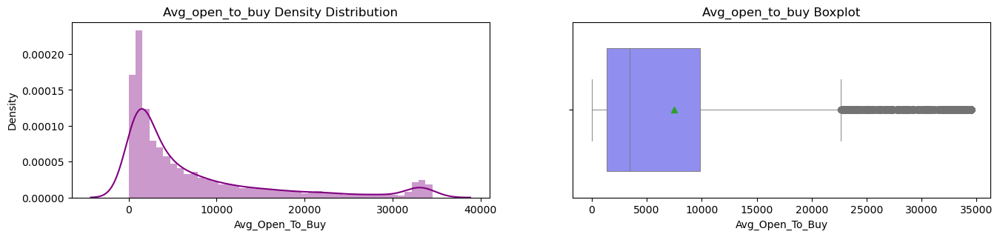

In [29]:
plot_hist_box_pot(data,'Avg_Open_To_Buy')

### Observation

>- `Average Open to Buy` has lots of higher end outliers, which means there are customers who uses only very small amount of their credit limit
>- Data is right skewed

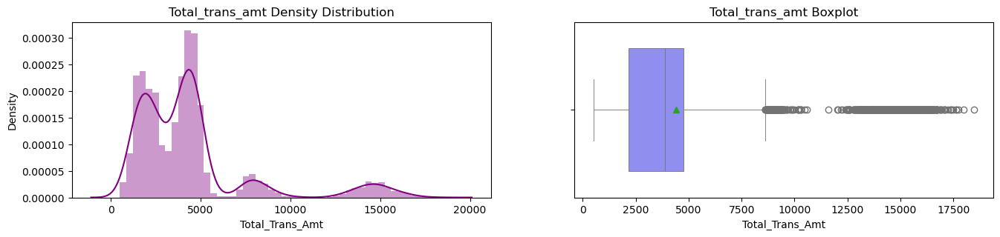

In [30]:
plot_hist_box_pot(data,'Total_Trans_Amt')

### Observation:

> Outliers are on both higher and lower end

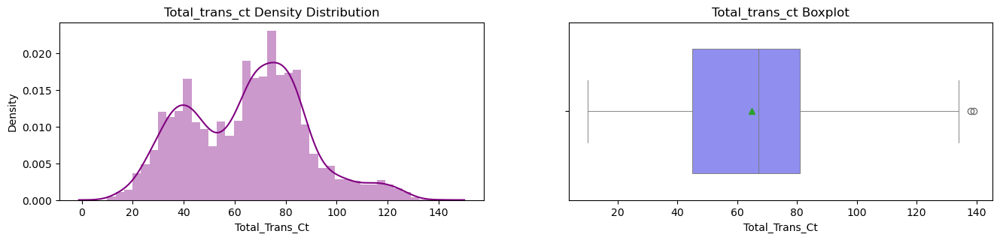

In [31]:
plot_hist_box_pot(data,'Total_Trans_Ct')

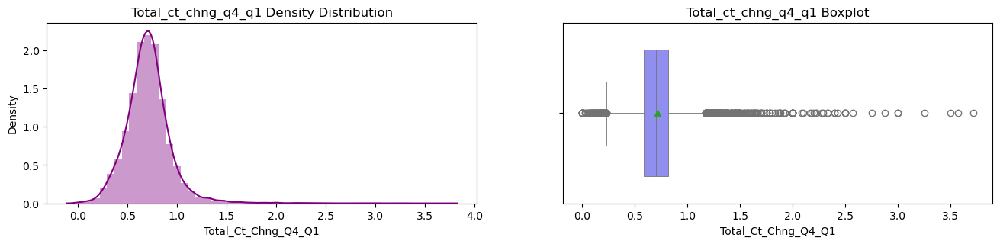

In [32]:
plot_hist_box_pot(data,'Total_Ct_Chng_Q4_Q1')

### Observation:
> Outliers are on both higher and lower end

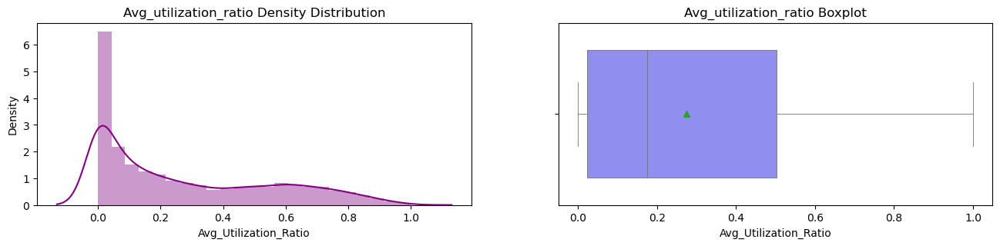

In [33]:
plot_hist_box_pot(data,'Avg_Utilization_Ratio')

### Observation:
> `Average utilization` is right skewed

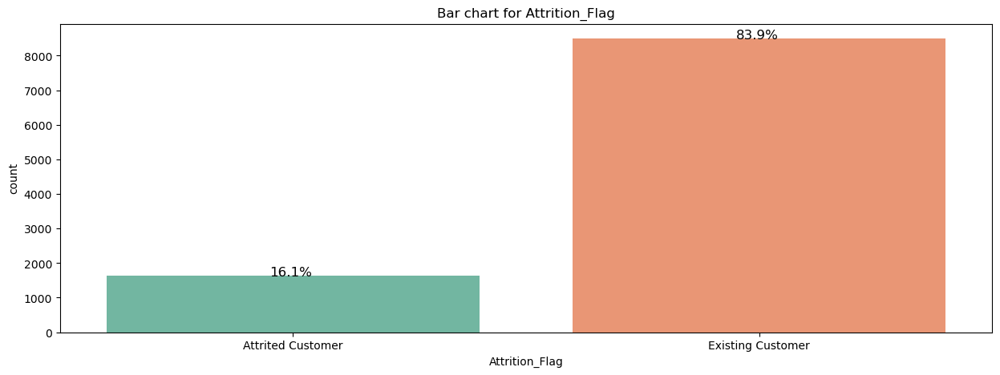

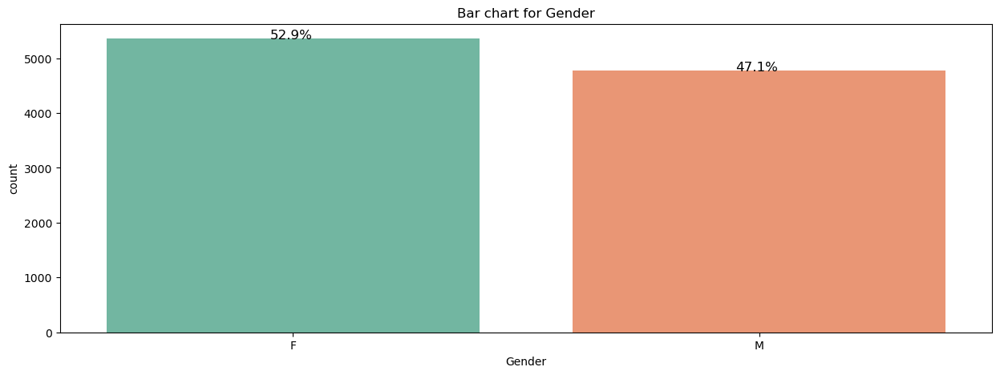

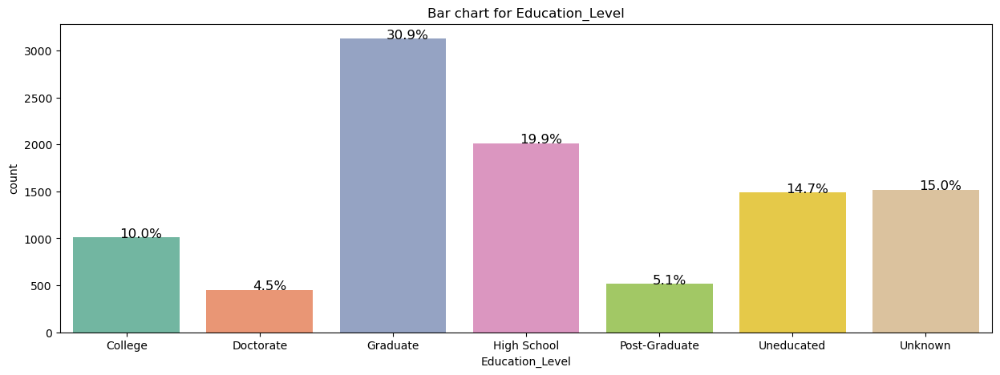

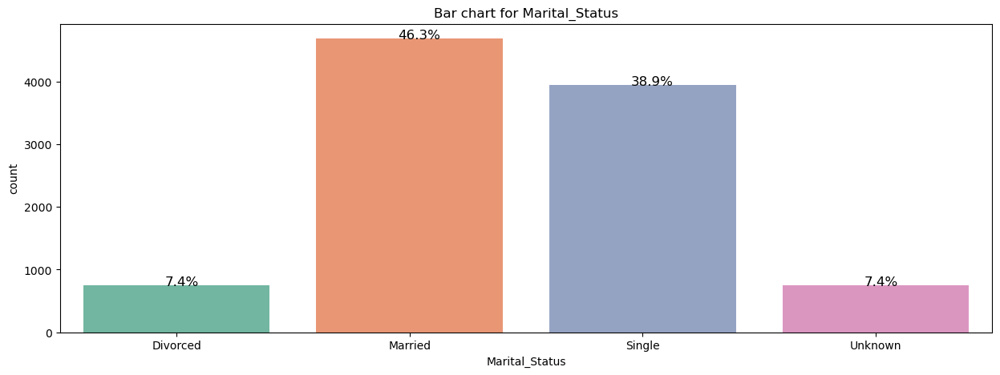

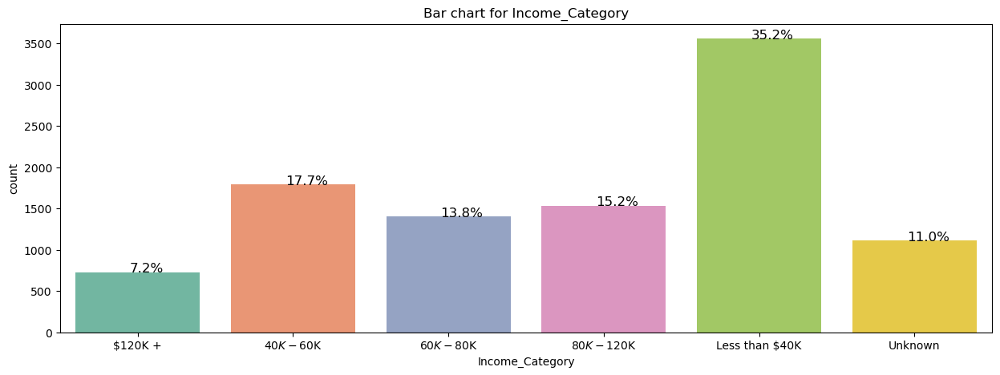

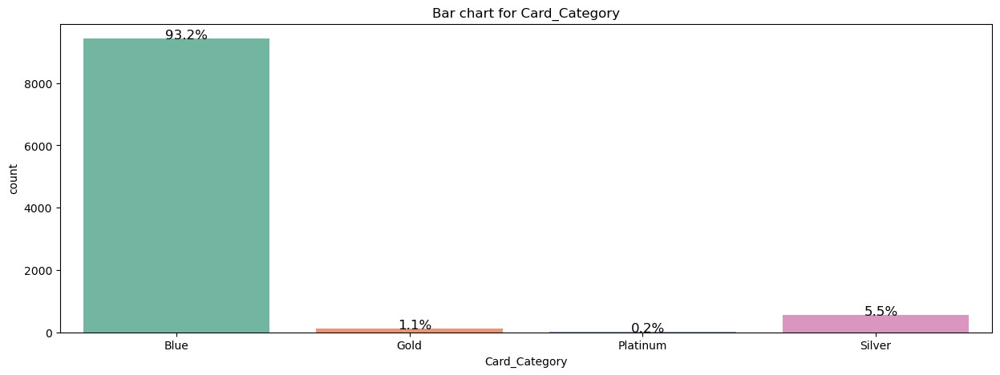

In [34]:
# prompt: bar chart with percentage for categorical features

def perc_on_bar(plot, feature):
  '''
  plot
    - matplotlib.pyplot object
    - should be a bar plot
  feature
    - string
    - feature name whose value counts are being displayed
  '''

  total = len(feature) # length of the column
  for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # height of the plot
        plot.annotate(percentage, (x, y), size = 12) # annotate the percentage

#function to plot bar chart with percentage for categorical features
def bar_perc(data,x):
  plt.figure(figsize=(15,5))
  ax = sns.countplot(x=x,data = data,palette='Set2')
  plt.title(f'Bar chart for {x}')
  perc_on_bar(ax,data[x])
  plt.show()

for col in data.select_dtypes(include='category').columns:
  bar_perc(data,col)


### Observation:

>- `High Imbalance` in data since the existing vs. attrited customers ratio is 84:16
>- Data is almost equally distributed between `Males and Females`
>- `31%` customers are `Graduate`
>- `~85%` customers are `either Single or Married`, where `46.7%` of the customers are `Married`
>- `35%` customers earn `less than $40k` and `36%` earns `$60k or more`
>- `~93%` customers have `Blue card`

### Bi-variate Analysis


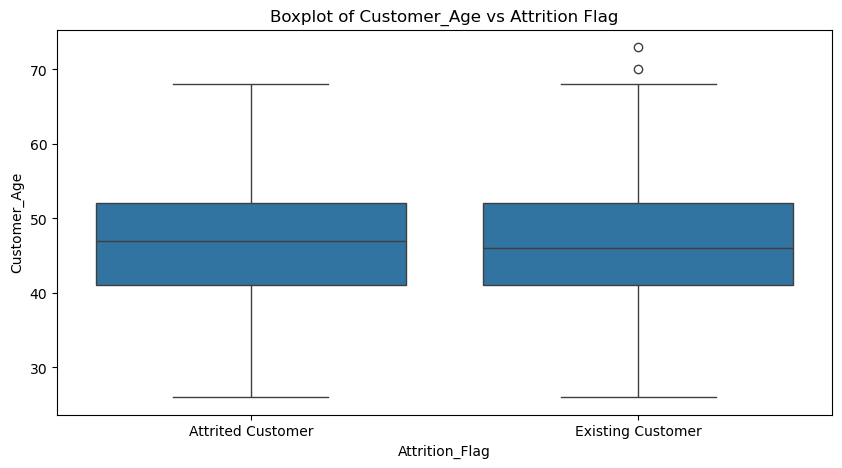

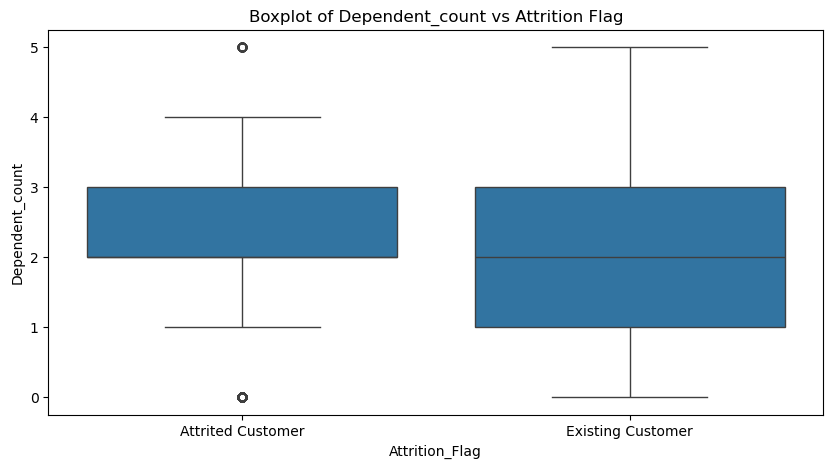

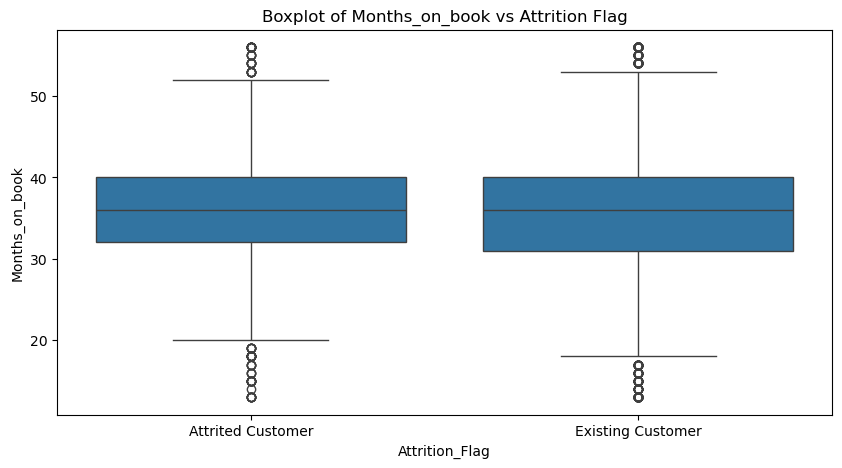

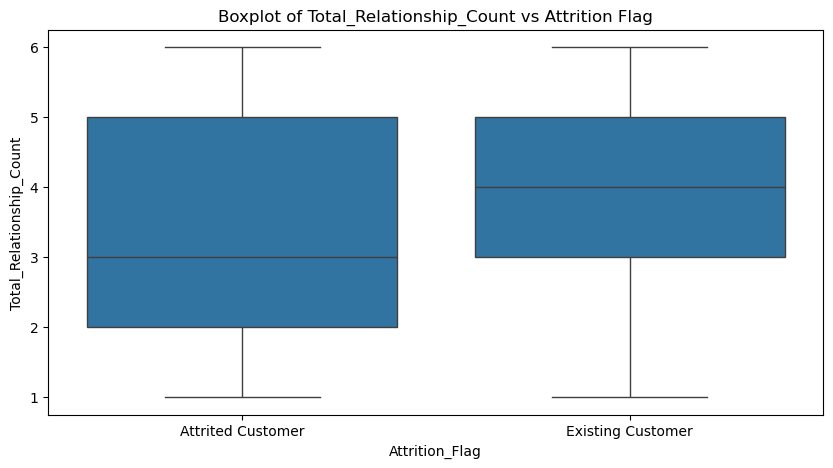

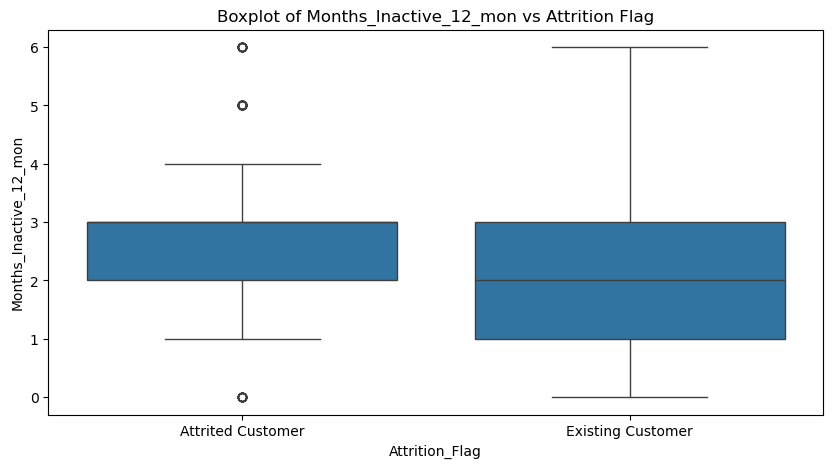

...

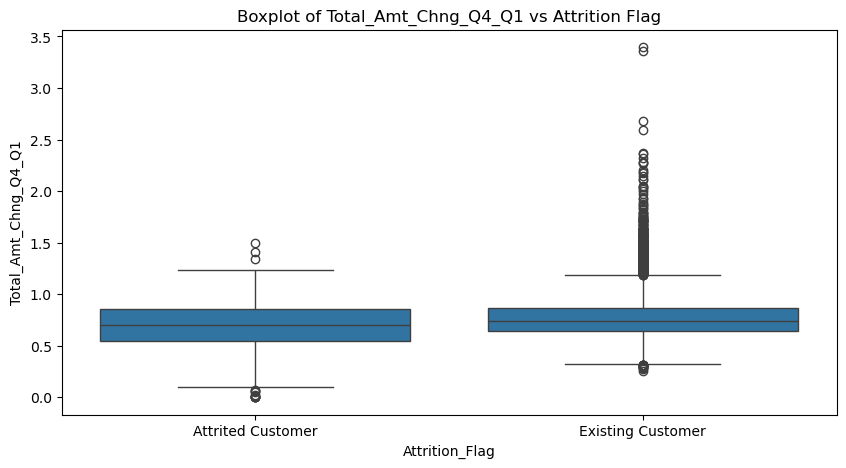

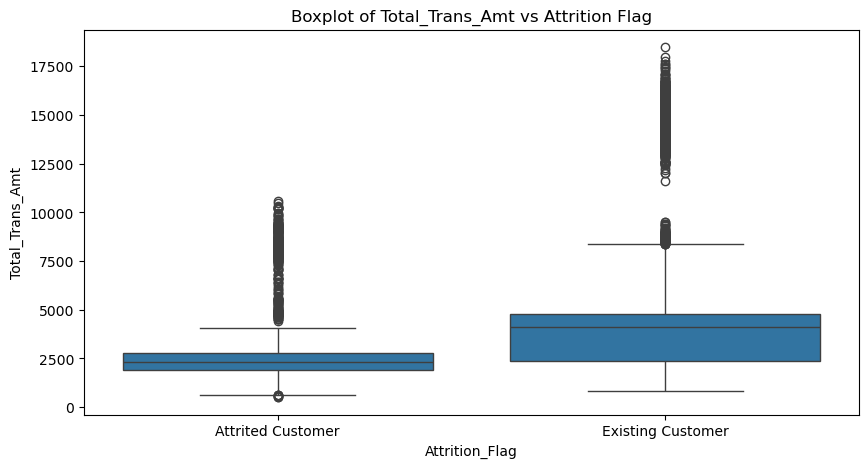

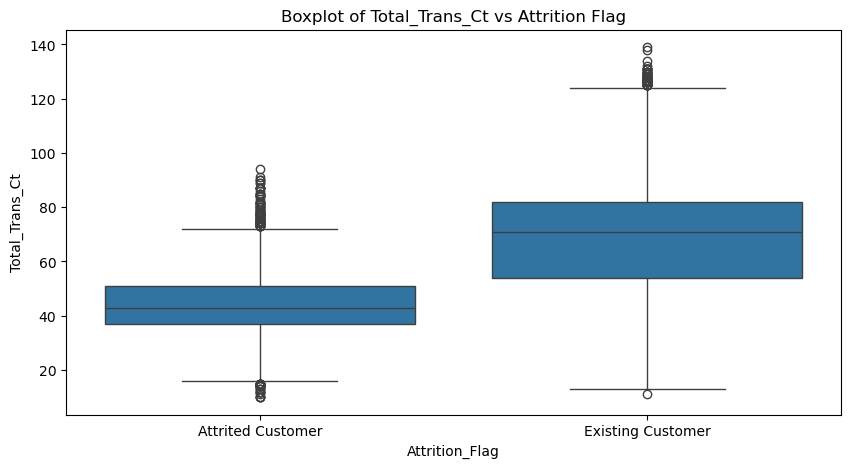

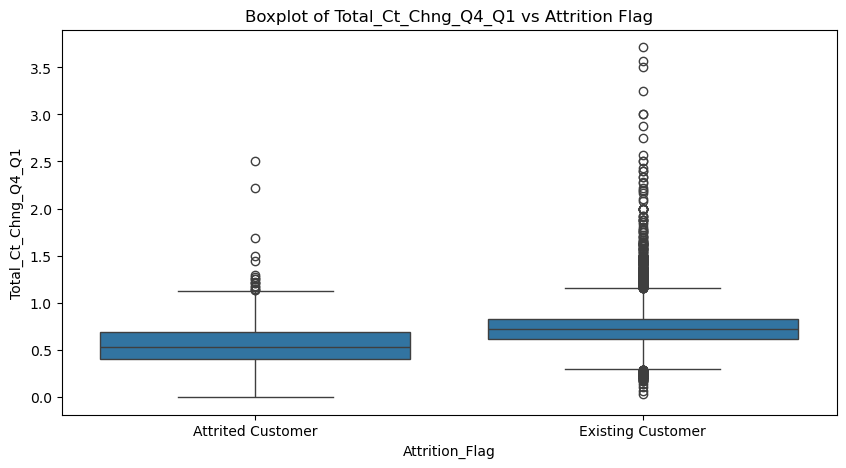

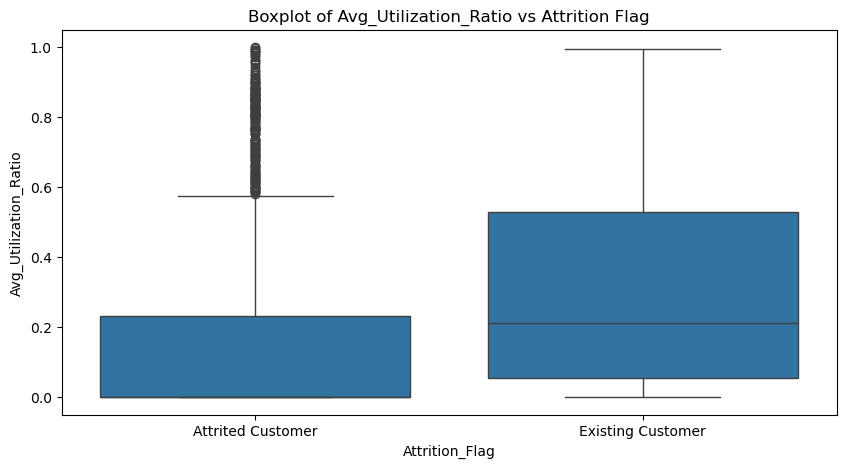

In [35]:
# box plot for Attrition_Flag vs numerical columns

# Boxplot for Attrition_Flag vs. Numerical columns
for col in data.select_dtypes(include='number').columns:
  plt.figure(figsize=(10,5))
  sns.boxplot(x='Attrition_Flag', y=col, data=data)
  plt.title(f'Boxplot of {col} vs Attrition Flag')
  plt.show()


### Observation:
> Attrited customers have

>- Lower `total transaction amount`
>- Lower `total transaction count`
>- Lower `utilization ratio`
>- Lower `transaction count change Q4 to Q1`
>- Higher `number of times contacted with or by the bank`

In [36]:
# Create a function that returns a Pie chart and a Bar Graph for the categorical variables:
def cat_view(df: pd.DataFrame, x, target):
    """
    Function to create a Bar chart and a Pie chart for categorical variables.
    """
    from matplotlib import cm

    color1 = cm.inferno(np.linspace(0.4, 0.8, 30))
    color2 = cm.viridis(np.linspace(0.4, 0.8, 30))
    sns.set_palette("cubehelix")
    fig, ax = plt.subplots(1, 2, figsize=(16, 4))

    """
    Draw a Pie Chart on first subplot.
    """
    s = data.groupby(x).size()

    mydata_values = s.values.tolist()
    mydata_index = s.index.tolist()

    def func(pct, allvals):
        absolute = int(pct / 100.0 * np.sum(allvals))
        return "{:.1f}%\n({:d})".format(pct, absolute)

    wedges, texts, autotexts = ax[0].pie(
        mydata_values,
        autopct=lambda pct: func(pct, mydata_values),
        textprops=dict(color="w"),
    )

    ax[0].legend(
        wedges,
        mydata_index,
        title=x.capitalize(),
        loc="center left",
        bbox_to_anchor=(1, 0, 0.5, 1),
    )

    plt.setp(autotexts, size=12)

    ax[0].set_title(f"{x.capitalize()} Pie Chart")

    """
    Draw a Bar Graph on second subplot.
    """

    df = pd.pivot_table(
        data, index=[x], columns=[target], values=["Credit_Limit"], aggfunc=len
    )

    labels = df.index.tolist()
    no = df.values[:, 1].tolist()
    yes = df.values[:, 0].tolist()

    l = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    rects1 = ax[1].bar(
        l - width / 2, no, width, label="Existing Customer", color=color1
    )
    rects2 = ax[1].bar(
        l + width / 2, yes, width, label="Attrited Customer", color=color2
    )

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax[1].set_ylabel("Scores")
    ax[1].set_title(f"{x.capitalize()} Bar Graph")
    ax[1].set_xticks(l)
    ax[1].set_xticklabels(labels)
    ax[1].legend()

    def autolabel(rects):

        """Attach a text label above each bar in *rects*, displaying its height."""

        for rect in rects:
            height = rect.get_height()
            ax[1].annotate(
                "{}".format(height),
                xy=(rect.get_x() + rect.get_width() / 2, height),
                xytext=(0, 3),  # 3 points vertical offset
                textcoords="offset points",
                fontsize="medium",
                ha="center",
                va="bottom",
            )

    autolabel(rects1)
    autolabel(rects2)

    fig.tight_layout()
    plt.show()

    """
    Draw a Stacked Bar Graph on bottom.
    """

    sns.set(palette="tab10")
    tab = pd.crosstab(data[x], data[target], normalize="index")

    tab.plot.bar(stacked=True, figsize=(16, 3))
    plt.title(x.capitalize() + " Stacked Bar Plot")
    plt.legend(loc="upper right", bbox_to_anchor=(0, 1))
    plt.show()

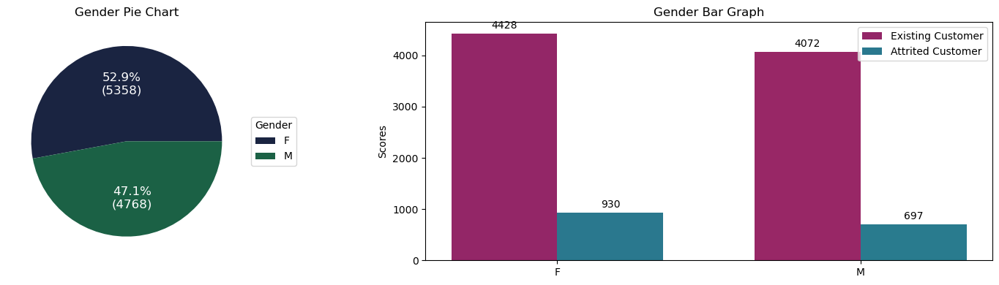

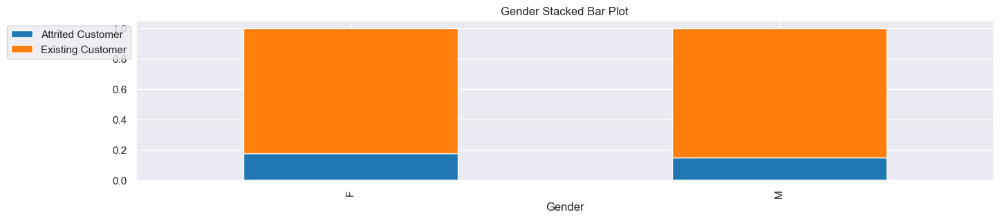

In [37]:
cat_view(data, "Gender", "Attrition_Flag")

### Observation:
>- Attrition does not seem to be related with Gender

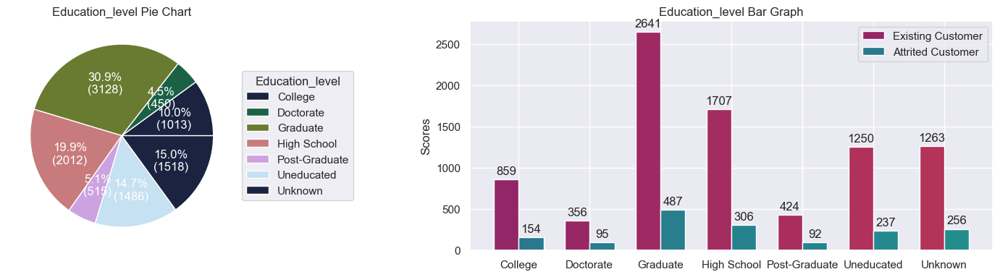

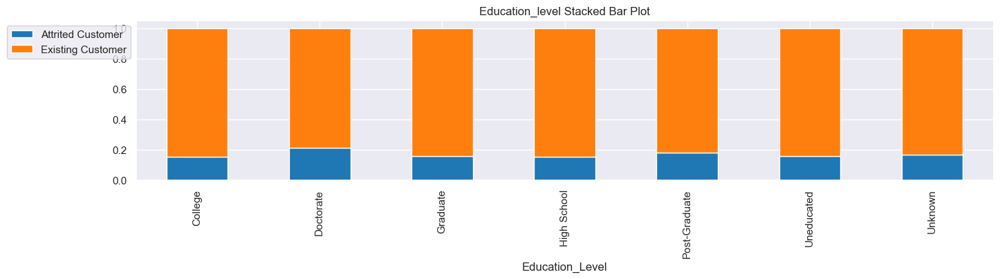

In [38]:
cat_view(data, "Education_Level", "Attrition_Flag")

### Observation:
>- Attrition does not seem to be related with Education

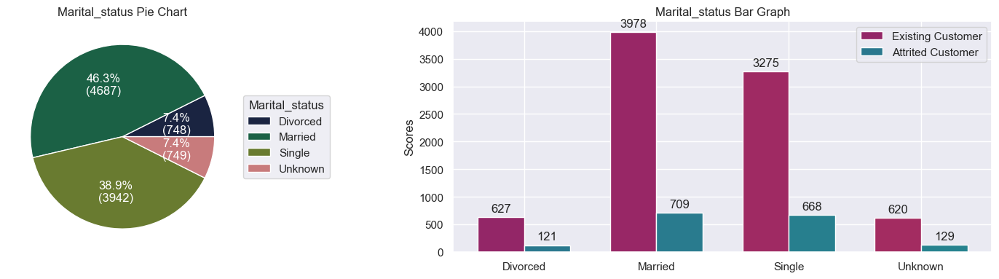

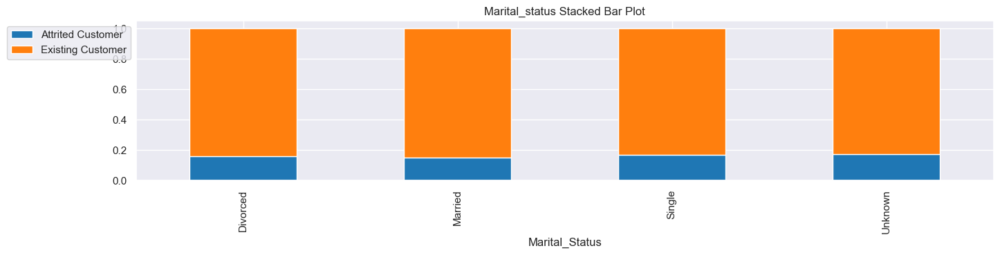

In [39]:
cat_view(data, "Marital_Status", "Attrition_Flag")

### Observation:
>- Attrition does not seem to be related with Marital Status

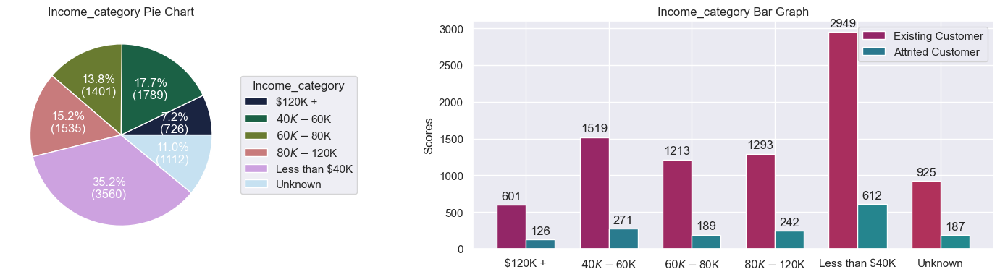

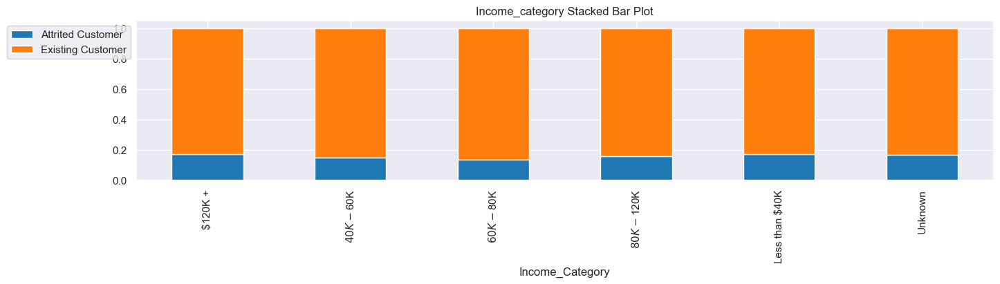

In [40]:
cat_view(data, "Income_Category", "Attrition_Flag")

### Observation:
>- Attrition does not seem to be related with Income Category

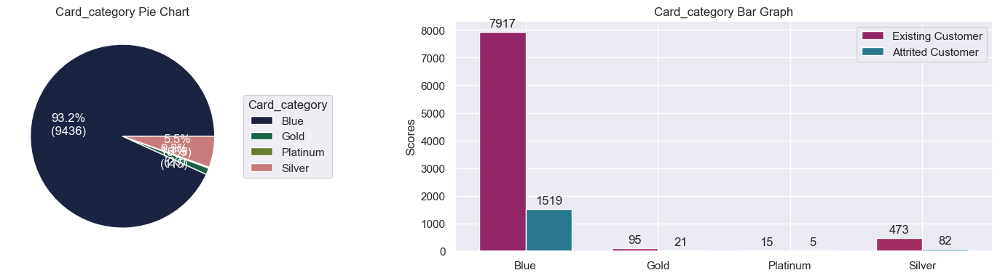

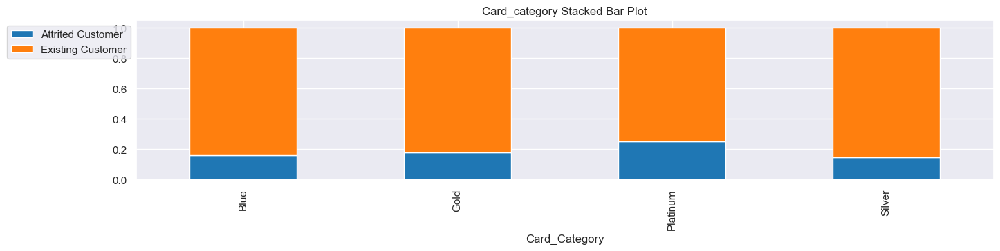

In [41]:
cat_view(data, "Card_Category", "Attrition_Flag")

### Observation:
>- `Platinum` card holder are appearing to be having attrition tendency, however, since there are only 20 data points for platinum card holders, this observation would be biased

### Multi-variate Plots

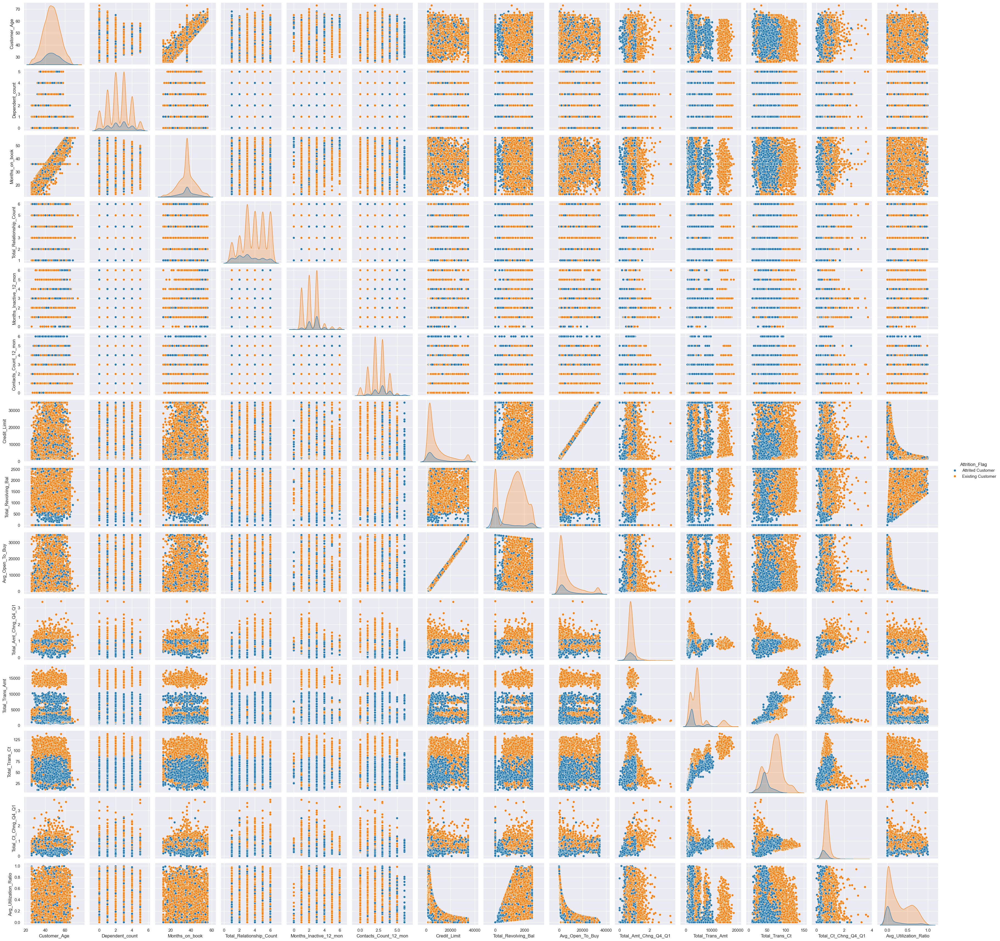

In [42]:
sns.pairplot(data, hue='Attrition_Flag',diag_kind='kde')

### Observation:
>- There are clusters formed with respect to attrition for the variables `total revolving amount`, `total amount change Q4 to Q1`, `total transaction amount`, `total transaction count`, `total transaction count change Q4 to Q1`
>- There are strong correlation between a few columns as well, which we'll check in below correlation heatmap.

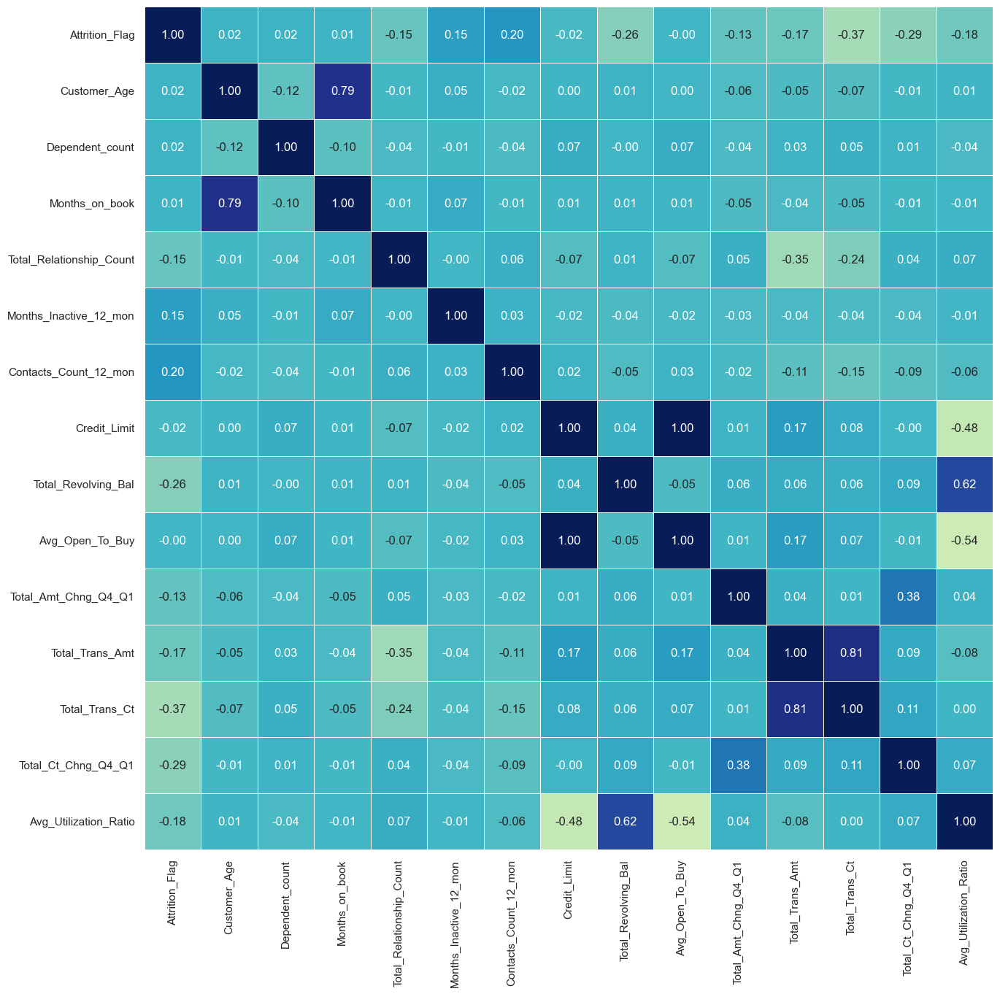

In [43]:
# Plotting correlation heatmap of the features
codes = {'Existing Customer':0, 'Attrited Customer':1}
data_clean = data.copy()
data_clean['Attrition_Flag'] = data_clean['Attrition_Flag'].map(codes).astype(int)


sns.set(rc={"figure.figsize": (15, 15)})
sns.heatmap(
    data_clean.corr(numeric_only=True),
    annot=True,
    linewidths=0.5,
    center=0,
    cbar=False,
    cmap="YlGnBu",
    fmt="0.2f",
)
plt.show()

### Observation:
>- `Credit Limit` and `Average Open to Buy` have 100% collinearity
>- `Months on book` and `Customer Age` have quite strong correlation
>- `Average Utilization Ration` and `Total Revolving Balance` are also a bit correlated it appears
>- `Attrition Flag` does not have highly strong correlation with any of the numeric variables
>- Customer Churn appears to be uncorrelated with `Customer Age`, `Dependent Count`, `Months on Book`, `Open to Buy`, `Credit Limit`, we'll remove these from dataset

###  Data Preprocessing
Pre-processing steps:

1. Data Split into Dependent and Target sets
1. Data Split to Train, Test and Validation sets
1. Drop unnecessary columns (`Client Number`, `Customer Age`, `Dependent Count`, `Months on Book`, `Open to Buy`, `Credit Limit`)
1. Missing Value/Incorrect Value treatment
1. Encoding
1. Scaling/Outlier treatment


### Building data transformer functions and classes

In [44]:
# Building data transformer functions and classes for dropping feature
def impute_category_unknown(df: pd.DataFrame, fill_value: str):
    df_ = df.copy()
    for col in df_.select_dtypes(include='category').columns.tolist():
        df_[col] = df_[col].astype('object')
        df_[col] = df_[col].fillna('Unknown')
        df_[col] = df_[col].astype('category')
    return df_

def mask_value(df: pd.DataFrame, feature: str = None, value_to_mask: str = None, masked_value: str = None):
    df_ = df.copy()
    if feature != None and value_to_mask != None:
        if feature in df_.columns:
            df_[feature] = df_[feature].astype('object')
            df_.loc[df_[df_[feature] == value_to_mask].index, feature] = masked_value
            df_[feature] = df_[feature].astype('category')

    return df_

class DropFeatures(TransformerMixin):
    def __init__(self, variables_to_drop=None):
        self.variables = variables_to_drop

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # encode labels
        X = X.copy()
        X = X.drop(self.variables, axis=1)

        return X

# Building a custom class to fill nulls with Unknown
class FillUnknown(TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        """All SciKit-Learn compatible transformers and classifiers have the
        same interface. `fit` always returns the same object."""
        return self

    def transform(self, X):
        """Return a dataframe with the required feature value masked as required."""
        X_ = impute_category_unknown(X, fill_value='Unknown')
        return X_


# Building a custom data preprocessing class with fit and transform methods for custom value masking

class CustomValueMasker(TransformerMixin):
    def __init__(self, feature: str, value_to_mask: str, masked_value: str):
        self.feature = feature
        self.value_to_mask = value_to_mask
        self.masked_value = masked_value

    def fit(self, X, y=None):
        """All SciKit-Learn compatible transformers and classifiers have the
        same interface. `fit` always returns the same object."""
        return self

    def transform(self, X):
        """Return a dataframe with the required feature value masked as required."""
        X_ = mask_value(X, self.feature, self.value_to_mask, self.masked_value)
        return X_

# Building a custom class to one-hot encode using pandas
class PandasOneHot(TransformerMixin):
    def __init__(self, columns: list = None):
        self.columns = columns

    def fit(self, X, y=None):
        """All SciKit-Learn compatible transformers and classifiers have the
        same interface. `fit` always returns the same object."""
        return self

    def transform(self, X):
        """Return a dataframe with the required feature value masked as required."""
        X_ = pd.get_dummies(X, columns = self.columns, drop_first=True)
        return X_

In [45]:
df = churn_df.copy()
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,NaN,NaN,NaN,739177606.333663,36903783.450231,708082083.0,713036770.5,717926358.0,773143533.0,828343083.0
Attrition_Flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,10127.0,NaN,NaN,NaN,46.32596,8.016814,26.0,41.0,46.0,52.0,73.0
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.0,NaN,NaN,NaN,2.346203,1.298908,0.0,1.0,2.0,3.0,5.0
Education_Level,8608,6,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,9378,3,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.0,NaN,NaN,NaN,35.928409,7.986416,13.0,31.0,36.0,40.0,56.0


In [46]:
# The static variables

# For dropping columns
columns_to_drop = [
    "CLIENTNUM",
    "Credit_Limit",
    "Dependent_count",
    "Months_on_book",
    "Avg_Open_To_Buy",
    "Customer_Age",
]

# For masking a particular value in a feature
column_to_mask_value = "Income_Category"
value_to_mask = "abc"
masked_value = "Unknown"

# Random state and loss
seed = 1
loss_func = "logloss"

# Test and Validation sizes
test_size = 0.2
val_size = 0.25

# Dependent Varibale Value map
target_mapper = {"Attrited Customer": 1, "Existing Customer": 0}

In [47]:
cat_columns = df.select_dtypes(include="object").columns.tolist()
df[cat_columns] = df[cat_columns].astype("category")

### Splitting Data in to Train , Test and Validation

In [48]:
X = df.drop(columns=["Attrition_Flag"])
y = df["Attrition_Flag"].map(target_mapper)

In [49]:
# Splitting data into training, validation and test set:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=test_size, random_state=seed, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=val_size, random_state=seed, stratify=y_temp
)
print(
    "Training data shape: \n\n",
    X_train.shape,
    "\n\nValidation Data Shape: \n\n",
    X_val.shape,
    "\n\nTesting Data Shape: \n\n",
    X_test.shape,
)

Training data shape: 

 (6075, 20) 

Validation Data Shape: 

 (2026, 20) 

Testing Data Shape: 

 (2026, 20)


### Data processing
We are using the pre-available transformation classes and the custom classes that we created to first fit the training data and then transform the train, validation and test dataset

In [50]:
# To Drop unnecessary columns
column_dropper = DropFeatures(variables_to_drop=columns_to_drop)

X_train = column_dropper.fit_transform(X_train)
X_val = column_dropper.transform(X_val)
X_test = column_dropper.transform(X_test)

print(X_train.info())
print(X_val.info())
print(X_test.info())

<class 'pandas.core.frame.DataFrame'>
Index: 6075 entries, 800 to 4035
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Gender                    6075 non-null   category
 1   Education_Level           5147 non-null   category
 2   Marital_Status            5618 non-null   category
 3   Income_Category           6075 non-null   category
 4   Card_Category             6075 non-null   category
 5   Total_Relationship_Count  6075 non-null   int64   
 6   Months_Inactive_12_mon    6075 non-null   int64   
 7   Contacts_Count_12_mon     6075 non-null   int64   
 8   Total_Revolving_Bal       6075 non-null   int64   
 9   Total_Amt_Chng_Q4_Q1      6075 non-null   float64 
 10  Total_Trans_Amt           6075 non-null   int64   
 11  Total_Trans_Ct            6075 non-null   int64   
 12  Total_Ct_Chng_Q4_Q1       6075 non-null   float64 
 13  Avg_Utilization_Ratio     6075 non-null   float64 


In [51]:
# To Mask incorrect/meaningless value of a feature
value_masker = CustomValueMasker(
    feature=column_to_mask_value, value_to_mask=value_to_mask, masked_value=masked_value
)
X_train = value_masker.fit_transform(X_train)
X_val = value_masker.transform(X_val)
X_test = value_masker.transform(X_test)
print(X_train.head())
print(X_val.head())
print(X_test.head())

     Gender Education_Level Marital_Status Income_Category Card_Category  \
800       M             NaN         Single         $120K +          Blue   
498       M             NaN        Married         Unknown          Blue   
4356      M     High School        Married    $80K - $120K          Blue   
407       M        Graduate            NaN     $60K - $80K        Silver   
8728      M     High School       Divorced     $40K - $60K        Silver   

      Total_Relationship_Count  Months_Inactive_12_mon  Contacts_Count_12_mon  \
800                          6                       4                      3   
498                          6                       2                      0   
4356                         5                       1                      2   
407                          6                       2                      0   
8728                         2                       2                      3   

      Total_Revolving_Bal  Total_Amt_Chng_Q4_Q1  Total_T

In [52]:
# To impute categorical Nulls to Unknown
cat_columns = X_train.select_dtypes(include="category").columns.tolist()
imputer = FillUnknown()

X_train[cat_columns] = imputer.fit_transform(X_train[cat_columns])
X_val[cat_columns] = imputer.transform(X_val[cat_columns])
X_test[cat_columns] = imputer.transform(X_test[cat_columns])
print(X_train.head())
print(X_val.head())
print(X_test.head())

     Gender Education_Level Marital_Status Income_Category Card_Category  \
800       M         Unknown         Single         $120K +          Blue   
498       M         Unknown        Married         Unknown          Blue   
4356      M     High School        Married    $80K - $120K          Blue   
407       M        Graduate        Unknown     $60K - $80K        Silver   
8728      M     High School       Divorced     $40K - $60K        Silver   

      Total_Relationship_Count  Months_Inactive_12_mon  Contacts_Count_12_mon  \
800                          6                       4                      3   
498                          6                       2                      0   
4356                         5                       1                      2   
407                          6                       2                      0   
8728                         2                       2                      3   

      Total_Revolving_Bal  Total_Amt_Chng_Q4_Q1  Total_T

In [53]:
# Apply one-hot encoding
#onehot=OneHotEncoder(handle_unknown='ignore') # Handle unknown categories
onehot=PandasOneHot()
X_train = onehot.fit_transform(X_train)
X_val = onehot.transform(X_val)
X_test = onehot.transform(X_test)
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(6075, 27)
(2026, 27)
(2026, 27)


In [54]:
robust_scaler = RobustScaler(with_centering=False, with_scaling=True)
num_columns = [
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Total_Revolving_Bal",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

X_train[num_columns] = pd.DataFrame(
    robust_scaler.fit_transform(X_train[num_columns]),
    columns=num_columns,
    index=X_train.index,
)
X_val[num_columns] = pd.DataFrame(
    robust_scaler.transform(X_val[num_columns]), columns=num_columns, index=X_val.index
)
X_test[num_columns] = pd.DataFrame(
    robust_scaler.transform(X_test[num_columns]),
    columns=num_columns,
    index=X_test.index,
)

## Model Buliding
### Model evaluation criterion:

### Model can make wrong predictions as:
1. Predicting a customer will attrite and the customer does not attrite - Loss of resources
2. Predicting a customer will not attrite and the customer attrites - Loss of opportunity for churning the customer

### Which case is more important?
* Predicting that customer will not attrite, but actually attrites, would result in loss for the bank since if predicted correctly, marketing/sales team could have contacted the customer to retain them. This would result in losses. So, the false negatives should be minimized.

### How to reduce this loss i.e need to reduce False Negatives?
* Company wants Recall to be maximized, greater the Recall lesser the chances of false negatives.

### Model Evaluation Functions - Scoring & Confusion Matrix

#### Function to get metrics score

In [55]:
def get_metrics_score(
    model, train, test, train_y, test_y, threshold=0.5, flag=False, roc=True
):
    """
    Function to calculate different metric scores of the model - Accuracy, Recall, Precision, and F1 score
    model: classifier to predict values of X
    train, test: Independent features
    train_y,test_y: Dependent variable
    threshold: thresold for classifiying the observation as 1
    flag: If the flag is set to True then only the print statements showing different will be displayed. The default value is set to True.
    roc: If the roc is set to True then only roc score will be displayed. The default value is set to False.
    """
    # defining an empty list to store train and test results

    score_list = []

    pred_train = model.predict_proba(train)[:, 1] > threshold
    pred_test = model.predict_proba(test)[:, 1] > threshold

    pred_train = np.round(pred_train)
    pred_test = np.round(pred_test)

    train_acc = accuracy_score(pred_train, train_y)
    test_acc = accuracy_score(pred_test, test_y)

    train_recall = recall_score(train_y, pred_train)
    test_recall = recall_score(test_y, pred_test)

    train_precision = precision_score(train_y, pred_train)
    test_precision = precision_score(test_y, pred_test)

    train_f1 = f1_score(train_y, pred_train)
    test_f1 = f1_score(test_y, pred_test)

    pred_train_proba = model.predict_proba(train)[:, 1]
    pred_test_proba = model.predict_proba(test)[:, 1]

    train_roc_auc = roc_auc_score(train_y, pred_train_proba)
    test_roc_auc = roc_auc_score(test_y, pred_test_proba)

    score_list.extend(
        (
            train_acc,
            test_acc,
            train_recall,
            test_recall,
            train_precision,
            test_precision,
            train_f1,
            test_f1,
            train_roc_auc,
            test_roc_auc,
        )
    )

    if flag == True:

        print("Accuracy on training set : ", accuracy_score(pred_train, train_y))
        print("Accuracy on test set : ", accuracy_score(pred_test, test_y))
        print("Recall on training set : ", recall_score(train_y, pred_train))
        print("Recall on test set : ", recall_score(test_y, pred_test))
        print("Precision on training set : ", precision_score(train_y, pred_train))
        print("Precision on test set : ", precision_score(test_y, pred_test))
        print("F1 on training set : ", f1_score(train_y, pred_train))
        print("F1 on test set : ", f1_score(test_y, pred_test))

    if roc == True:
        if flag == True:
            print(
                "ROC-AUC Score on training set : ",
                roc_auc_score(train_y, pred_train_proba),
            )
            print(
                "ROC-AUC Score on test set : ", roc_auc_score(test_y, pred_test_proba)
            )

    return score_list  # returning the list with train and test scores

### Function to make confusion matrix

In [56]:
def make_confusion_matrix(model, test_X, y_actual, labels=[1, 0]):
    """
    model : classifier to predict values of X
    test_X: test set
    y_actual : ground truth

    """
    y_predict = model.predict(test_X)
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=[1, 0])
    df_cm = pd.DataFrame(
        cm,
        index=[i for i in ["Actual - Attrited", "Actual - Existing"]],
        columns=[i for i in ["Predicted - Attrited", "Predicted - Existing"]],
    )
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    plt.figure(figsize=(5, 3))
    sns.heatmap(df_cm, annot=labels, fmt="", cmap="Blues").set(title="Confusion Matrix")

#### Function to Add Scores to Scoring Lists

In [57]:
# # defining empty lists to add train and test results

model_names = []
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = []
f1_test = []
roc_auc_train = []
roc_auc_test = []
cross_val_train = []


def add_score_model(model_name, score, cv_res):
    """Add scores to list so that we can compare all models score together"""
    model_names.append(model_name)
    acc_train.append(score[0])
    acc_test.append(score[1])
    recall_train.append(score[2])
    recall_test.append(score[3])
    precision_train.append(score[4])
    precision_test.append(score[5])
    f1_train.append(score[6])
    f1_test.append(score[7])
    roc_auc_train.append(score[8])
    roc_auc_test.append(score[9])
    cross_val_train.append(cv_res)

### Building Models

We are building below 5 models:  
&nbsp;


1. Bagging
1. Random Forest Classification
1. Gradient Boosting Machine
1. Adaptive Boosting
1. Light Gradient Boosting Machine

In [58]:
models = []  # Empty list to store all the models
cv_results = []

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=seed)))
models.append(("Random forest", RandomForestClassifier(random_state=seed)))
models.append(("GBM", GradientBoostingClassifier(random_state=seed)))
models.append(("Adaboost", AdaBoostClassifier(random_state=seed)))
models.append(("Light GBM", lgb.LGBMClassifier(random_state=seed)))

# For each model, run cross validation on 9 folds (+ 1 validation fold) with scoring for recall
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10

    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    cv_results.append(cv_result)

    model.fit(X_train, y_train)
    model_score = get_metrics_score(model, X_train, X_val, y_train, y_val)
    add_score_model(name, model_score, cv_result.mean())

print("Operation Completed!")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 878, number of negative: 4589
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1451
[LightGBM] [Info] Number of data points in the train set: 5467, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160600 -> initscore=-1.653771
[LightGBM] [Info] Start training from score -1.653771
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 878, number of negative: 4589
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1450
[LightGBM] [Info] Numb

In [59]:
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Cross_Val_Score_Train": cross_val_train,
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
        "Train_ROC_AUC": roc_auc_train,
        "Test_ROC_AUC": roc_auc_test,
    }
)

# Sorting models in decreasing order of test recall
comparison_frame.sort_values(
    by=["Cross_Val_Score_Train", "Test_Recall"], ascending=False
).style.highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
4,Light GBM,0.851431,0.999012,0.969891,0.998975,0.880368,0.994898,0.928803,0.996933,0.903937,0.999996,0.993546
2,GBM,0.817620,0.969712,0.969398,0.873975,0.874233,0.933260,0.931373,0.902646,0.901899,0.992689,0.989946
3,Adaboost,0.799137,0.956379,0.961007,0.830943,0.849693,0.890231,0.902280,0.859565,0.875197,0.987073,0.979432
0,Bagging,0.785862,0.996049,0.954590,0.980533,0.822086,0.994802,0.887417,0.987616,0.853503,0.999899,0.978021
1,Random forest,0.770440,1.000000,0.959526,1.000000,0.812883,1.000000,0.926573,1.000000,0.866013,1.000000,0.983956


### Observation
>- The best model with respect to cross validation score and test recall is `Light GBM`
Followed by `GBM` ,`Adaboost` and `Bagging`

### Oversampling Data with SMOTE

In [60]:
print("Before UpSampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before UpSampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy="minority", k_neighbors=10, random_state=seed
)  # Synthetic Minority Over Sampling Technique

X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After UpSampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After UpSampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After UpSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After UpSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before UpSampling, counts of label 'Yes': 976
Before UpSampling, counts of label 'No': 5099 

After UpSampling, counts of label 'Yes': 5099
After UpSampling, counts of label 'No': 5099 

After UpSampling, the shape of train_X: (10198, 27)
After UpSampling, the shape of train_y: (10198,) 



In [61]:
### Build Models with Oversampled Data

In [62]:
models_over = []

# Appending models into the list

models_over.append(("Bagging UpSampling", BaggingClassifier(random_state=seed)))
models_over.append(
    ("Random forest UpSampling", RandomForestClassifier(random_state=seed))
)
models_over.append(("GBM UpSampling", GradientBoostingClassifier(random_state=seed)))
models_over.append(("Adaboost UpSampling", AdaBoostClassifier(random_state=seed)))
models_over.append(("Light GBM UpSampling", lgb.LGBMClassifier(random_state=seed)))

for name, model in models_over:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10

    cv_result_over = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
    )
    cv_results.append(cv_result_over)

    model.fit(X_train_over, y_train_over)
    model_score_over = get_metrics_score(
        model, X_train_over, X_val, y_train_over, y_val
    )
    add_score_model(name, model_score_over, cv_result_over.mean())

print("Operation Completed!")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4589, number of negative: 4589
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2331
[LightGBM] [Info] Number of data points in the train set: 9178, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4589, number of negative: 4589
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2331
[LightGBM] 

In [63]:
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Cross_Val_Score_Train": cross_val_train,
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
        "Train_ROC_AUC": roc_auc_train,
        "Test_ROC_AUC": roc_auc_test,
    }
)

# Sorting models in decreasing order of test recall
comparison_frame.sort_values(
    by=["Test_Recall", "Cross_Val_Score_Train"], ascending=False
).style.highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
9,Light GBM UpSampling,0.979799,0.997254,0.964956,0.998823,0.917178,0.995699,0.871720,0.997259,0.893871,0.999973,0.992508
7,GBM UpSampling,0.965483,0.970484,0.957552,0.975093,0.917178,0.966187,0.835196,0.970620,0.874269,0.995988,0.988805
8,Adaboost UpSampling,0.956068,0.952932,0.941264,0.960188,0.914110,0.946453,0.766067,0.953271,0.833566,0.991303,0.983562
6,Random forest UpSampling,0.981761,1.000000,0.956565,1.000000,0.895706,1.000000,0.843931,1.000000,0.869048,1.000000,0.985522
4,Light GBM,0.851431,0.999012,0.969891,0.998975,0.880368,0.994898,0.928803,0.996933,0.903937,0.999996,0.993546
2,GBM,0.817620,0.969712,0.969398,0.873975,0.874233,0.933260,0.931373,0.902646,0.901899,0.992689,0.989946
5,Bagging UpSampling,0.959602,0.996960,0.943731,0.996862,0.861963,0.997058,0.802857,0.996960,0.831361,0.999969,0.973466
3,Adaboost,0.799137,0.956379,0.961007,0.830943,0.849693,0.890231,0.902280,0.859565,0.875197,0.987073,0.979432
0,Bagging,0.785862,0.996049,0.954590,0.980533,0.822086,0.994802,0.887417,0.987616,0.853503,0.999899,0.978021
1,Random forest,0.770440,1.000000,0.959526,1.000000,0.812883,1.000000,0.926573,1.000000,0.866013,1.000000,0.983956


### Observation:
>- The best 4 models with respect to validation recall and cross validation score, are as follows:
>1. Light GBM trained with over/up-sampled data
>1. GBM trained with over/up-sampled data
>1. AdaBoost trained with over/up-sampled data
>1. RandomForest trained with over/up-sampled data

### Undersampling train data using Random Under Sampler

In [64]:
rus = RandomUnderSampler(random_state=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [65]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 'Yes': 976
Before Under Sampling, counts of label 'No': 5099 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 27)
After Under Sampling, the shape of train_y: (1952,) 



### Build Models with Undersampled Data

In [66]:
models_under = []

# Appending models into the list

models_under.append(("Bagging DownSampling", BaggingClassifier(random_state=seed)))
models_under.append(
    ("Random forest DownSampling", RandomForestClassifier(random_state=seed))
)
models_under.append(("GBM DownSampling", GradientBoostingClassifier(random_state=seed)))
models_under.append(("Adaboost DownSampling", AdaBoostClassifier(random_state=seed)))
models_under.append(("Light GBM DownSampling", lgb.LGBMClassifier(random_state=seed)))

for name, model in models_under:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10

    cv_result_under = cross_val_score(
        estimator=model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
    )
    cv_results.append(cv_result_under)

    model.fit(X_train_un, y_train_un)
    model_score_under = get_metrics_score(model, X_train_un, X_val, y_train_un, y_val)
    add_score_model(name, model_score_under, cv_result_under.mean())

print("Operation Completed!")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 878, number of negative: 878
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1434
[LightGBM] [Info] Number of data points in the train set: 1756, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 878, number of negative: 878
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1434
[LightGBM] [Info] Number of data points in the train set: 1756, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.5

In [67]:
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Cross_Val_Score_Train": cross_val_train,
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
        "Train_ROC_AUC": roc_auc_train,
        "Test_ROC_AUC": roc_auc_test,
    }
)

# Sorting models in decreasing order of test recall
comparison_frame.sort_values(
    by=["Test_Recall", "Cross_Val_Score_Train"], ascending=False
).style.highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
13,Adaboost DownSampling,0.925174,0.947746,0.936328,0.952869,0.963190,0.943205,0.728538,0.948012,0.829590,0.989348,0.985150
14,Light GBM DownSampling,0.953871,1.000000,0.939783,1.000000,0.957055,1.000000,0.742857,1.000000,0.836461,1.000000,0.991133
12,GBM DownSampling,0.951799,0.967725,0.938796,0.979508,0.957055,0.956957,0.739336,0.968101,0.834225,0.995357,0.989749
11,Random forest DownSampling,0.935388,1.000000,0.928430,1.000000,0.932515,1.000000,0.711944,1.000000,0.807437,1.000000,0.979840
10,Bagging DownSampling,0.920029,0.994365,0.924482,0.990779,0.932515,0.997936,0.698851,0.994344,0.798949,0.999701,0.972970
9,Light GBM UpSampling,0.979799,0.997254,0.964956,0.998823,0.917178,0.995699,0.871720,0.997259,0.893871,0.999973,0.992508
7,GBM UpSampling,0.965483,0.970484,0.957552,0.975093,0.917178,0.966187,0.835196,0.970620,0.874269,0.995988,0.988805
8,Adaboost UpSampling,0.956068,0.952932,0.941264,0.960188,0.914110,0.946453,0.766067,0.953271,0.833566,0.991303,0.983562
6,Random forest UpSampling,0.981761,1.000000,0.956565,1.000000,0.895706,1.000000,0.843931,1.000000,0.869048,1.000000,0.985522
4,Light GBM,0.851431,0.999012,0.969891,0.998975,0.880368,0.994898,0.928803,0.996933,0.903937,0.999996,0.993546


>- The 3 best models are:
>1. AdaBoost trained with undersampled data
>2. Light GBM trained with undersampled data
>3. GBM trained with undersampled data
&nbsp;

>We will now try to tune these 3 models using Random Search CV

### Choice for Model Tunning

>1. `AdaBoost` is generalizing the model very well, it is neither over-fitting, nor has any bias, AUC is 0.985 and cross validation score on train is 93%.
&nbsp;

>2. `Light GBM` works really well in all aspects, but there is slight over-fitting problem, which we expect to resolve by tuning. Accuracy on validation is 94%, with cross validation score on train 95%, recall on validation ~96%, AUC is 0.99. This looks like a very promising model.
&nbsp;

>3. `GBM` is not overfitting, and neither it is suffering from bias or variance. Recall on validation is ~96%, accuracy on validation ~94%, AUC is ~0.99, cross validation score on train is ~95%. This looks very promising model

if we tune this models we can improve the performance of models

## Model Tuning using RandomizedSearchCV

### Train AdaBoost with undersample data

In [68]:
# defining model
model = AdaBoostClassifier(random_state=seed)



# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators':np.arange(50,2000,50),
            'learning_rate':[0.01,0.1,0.2,0.05]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
ada_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=10, random_state=seed, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
ada_tuned.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(ada_tuned.best_params_,ada_tuned.best_score_))

Best parameters are {'n_estimators': 1050, 'learning_rate': 0.1} with CV score=0.9405743740795287:


### Building the model with the resulted best parameters

In [69]:
# building model with best parameters
ada_tuned_model = AdaBoostClassifier(
    n_estimators=1050, learning_rate=0.1, random_state=seed
)
# Fit the model on training data
ada_tuned_model.fit(X_train_un, y_train_un)

AdaBoostClassifier(learning_rate=0.1, n_estimators=1050, random_state=1)

### Get scores

In [70]:
ada_tuned_model_score = get_metrics_score(
    ada_tuned_model, X_train, X_val, y_train, y_val
)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

scoring = "recall"
ada_down_cv = cross_val_score(
    estimator=ada_tuned_model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
)


add_score_model(
    "AdaBoost Tuned with Down Sampling", ada_tuned_model_score, ada_down_cv.mean()
)

### Confusion matrix on validation

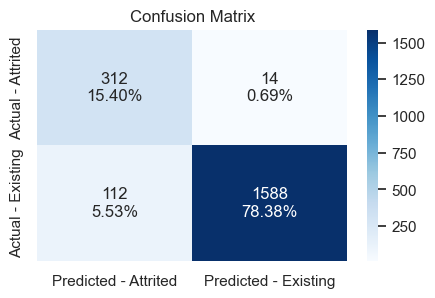

In [71]:
make_confusion_matrix(ada_tuned_model, X_val, y_val)

### Tuning Light GBM with Down-Sampled data

In [72]:
# defining model
model = lgb.LGBMClassifier(random_state=seed)

# Hyper parameters
min_gain_to_split = [0.01, 0.1, 0.2, 0.3]
min_data_in_leaf = [10, 20, 30, 40, 50]
feature_fraction = [0.8, 0.9, 1.0]
max_depth = [5, 8, 15, 25, 30]
extra_trees = [True, False]
learning_rate = [0.01,0.1,0.2,0.05]

# Parameter grid to pass in RandomizedSearchCV
param_grid={'min_gain_to_split': min_gain_to_split,
               'min_data_in_leaf': min_data_in_leaf,
               'feature_fraction': feature_fraction,
               'max_depth': max_depth,
               'extra_trees': extra_trees,
               'learning_rate': learning_rate,
               'boosting_type': ['gbdt'],
               'objective': ['binary'],
               'is_unbalance': [True],
               'metric': ['binary_logloss'],}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
lgbm_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=10, random_state=seed, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
lgbm_tuned.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(lgbm_tuned.best_params_,lgbm_tuned.best_score_))

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since

### Building the model with the resulted best parameters

In [73]:
# building model with best parameters
lgbm_tuned_model = lgb.LGBMClassifier(
               min_gain_to_split = 0.01,
               min_data_in_leaf = 50,
               feature_fraction = 0.8,
               max_depth = 8,
               extra_trees = False,
               learning_rate = 0.2,
               objective = 'binary',
               metric = 'binary_logloss',
               is_unbalance = True,
               boosting_type = 'gbdt',
               random_state = seed
)
# Fit the model on training data
lgbm_tuned_model.fit(X_train_un, y_train_un)

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since

LGBMClassifier(extra_trees=False, feature_fraction=0.8, is_unbalance=True,
               learning_rate=0.2, max_depth=8, metric='binary_logloss',
               min_data_in_leaf=50, min_gain_to_split=0.01, objective='binary',
               random_state=1)

### Get Score

In [74]:
lgbm_tuned_model_score = get_metrics_score(
    lgbm_tuned_model, X_train, X_val, y_train, y_val
)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

scoring = "recall"
lgb_down_cv = cross_val_score(
    estimator=lgbm_tuned_model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
)


add_score_model(
    "Light GBM Tuned with Down Sampling", lgbm_tuned_model_score, lgb_down_cv.mean()
)

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=3

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 879, number of negative: 878
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1431
[LightGBM] [Info] Number of data points in the train set: 1757, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500285 -> ini

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=3

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 878, number of negative: 879
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1432
[LightGBM] [Info] Number of data points in the train set: 1757, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499715 -> ini

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

### Confusion matrix on validation

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


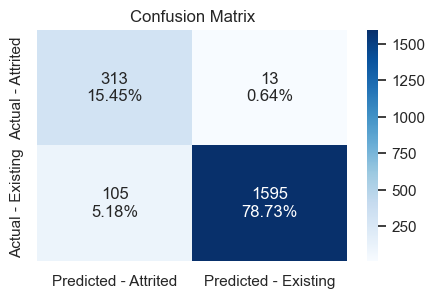

In [75]:
make_confusion_matrix(lgbm_tuned_model, X_val, y_val)

### Tuning GBM with Down Sampled data

In [76]:
# defining model
model = GradientBoostingClassifier(random_state=seed)

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 2000, num = 10)]
max_features = [1.0, 'sqrt']
max_depth = [5, 8, 15, 25, 30]
min_samples_split = [2, 5, 10, 15, 100]
min_samples_leaf = [1, 2, 5, 10, 15]


# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
gbm_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=10, random_state=seed, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
gbm_tuned.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(gbm_tuned.best_params_,gbm_tuned.best_score_))

Best parameters are {'n_estimators': 700, 'min_samples_split': 2, 'min_samples_leaf': 15, 'max_features': 1.0, 'max_depth': 25} with CV score=0.9590258783925941:


### Building the model with the resulted best parameters

In [77]:
# building model with best parameters
gbm_tuned_model = GradientBoostingClassifier(
    n_estimators=700,
    max_features=1.0,
    max_depth=25,
    min_samples_split=2,
    min_samples_leaf=15,
    random_state=seed,
)
# Fit the model on training data
gbm_tuned_model.fit(X_train_un, y_train_un)

GradientBoostingClassifier(max_depth=25, max_features=1.0, min_samples_leaf=15,
                           n_estimators=700, random_state=1)

### Get scores

In [78]:
gbm_tuned_model_score = get_metrics_score(
    gbm_tuned_model, X_train, X_val, y_train, y_val
)


kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

scoring = "recall"
gbm_down_cv = cross_val_score(
    estimator=gbm_tuned_model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
)


add_score_model(
    "GBM Tuned with Down Sampling", gbm_tuned_model_score, gbm_down_cv.mean()
)

### Confusion matrix on validation

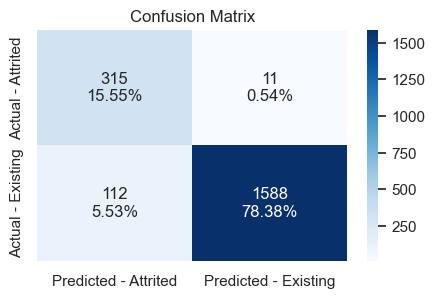

In [79]:
make_confusion_matrix(gbm_tuned_model, X_val, y_val)

### Comparing Models

In [80]:
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Cross_Val_Score_Train": cross_val_train,
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
        "Train_ROC_AUC": roc_auc_train,
        "Test_ROC_AUC": roc_auc_test,
    }
)


for col in comparison_frame.select_dtypes(include="float64").columns.tolist():
    comparison_frame[col] = round(comparison_frame[col] * 100, 0).astype(int)


comparison_frame.tail(4).sort_values(
    by=["Cross_Val_Score_Train", "Test_Recall"], ascending=False
)

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
16,Light GBM Tuned with Down Sampling,96,96,94,100,96,78,75,88,84,100,99
17,GBM Tuned with Down Sampling,95,95,94,100,97,77,74,87,84,100,99
14,Light GBM DownSampling,95,100,94,100,96,100,74,100,84,100,99
15,AdaBoost Tuned with Down Sampling,94,94,94,96,96,73,74,83,83,99,99


### Final Model Selection
>- The `Light GBM Tuned with Down Sampling` has best Cross_val_score  of ~96%  while `GBM Tuned with Down Sampling` has better validation ~97% recall both model is neither suffering from bias, nor variance.  We are selecting `GBM Tuned with Down Sampling` model as our final model because of little high recall and this model also giving similar performance as `Light GBM'


### Check Test Data on GBM Tuned and Trained with Downsampled Data

#### Feature Importance

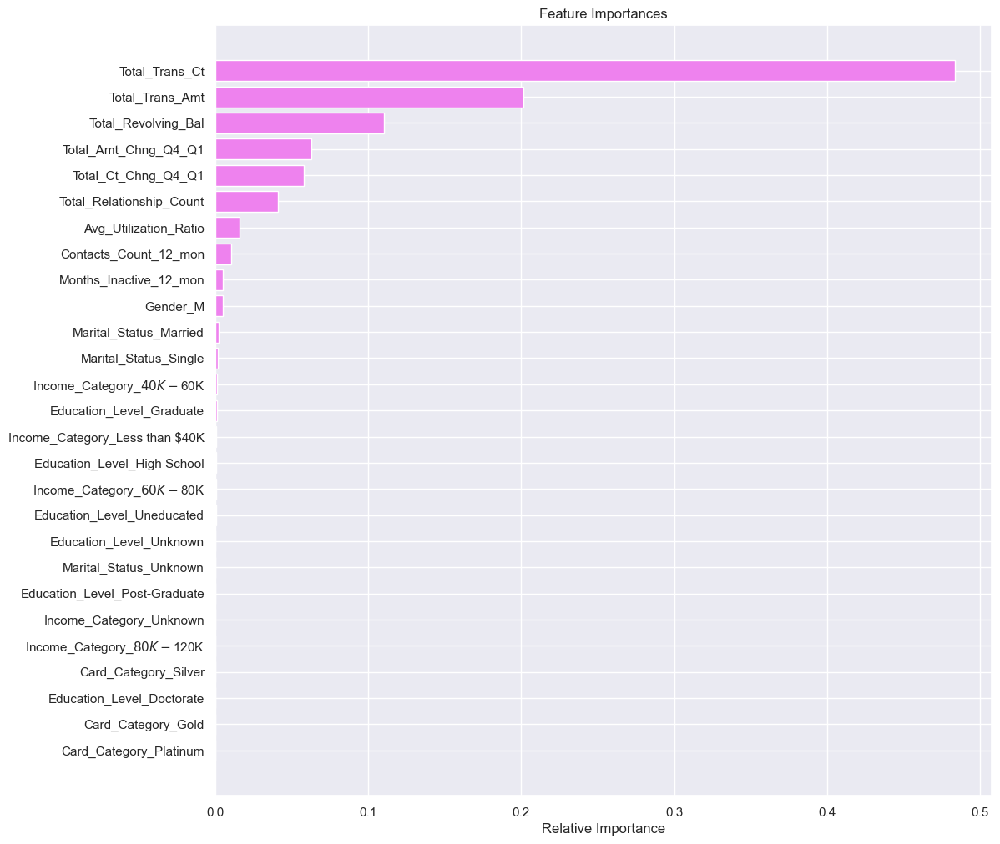

In [81]:
feature_names = X_train.columns
importances = gbm_tuned_model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

### Test scores

In [82]:
gbm_tuned_model_test_score = get_metrics_score(
    gbm_tuned_model, X_train, X_test, y_train, y_test
)

final_model_names = ["gbm Tuned Down-sampled Trained"]
final_acc_train = [gbm_tuned_model_test_score[0]]
final_acc_test = [gbm_tuned_model_test_score[1]]
final_recall_train = [gbm_tuned_model_test_score[2]]
final_recall_test = [gbm_tuned_model_test_score[3]]
final_precision_train = [gbm_tuned_model_test_score[4]]
final_precision_test = [gbm_tuned_model_test_score[5]]
final_f1_train = [gbm_tuned_model_test_score[6]]
final_f1_test = [gbm_tuned_model_test_score[7]]
final_roc_auc_train = [gbm_tuned_model_test_score[8]]
final_roc_auc_test = [gbm_tuned_model_test_score[9]]

final_result_score = pd.DataFrame(
    {
        "Model": final_model_names,
        "Train_Accuracy": final_acc_train,
        "Test_Accuracy": final_acc_test,
        "Train_Recall": final_recall_train,
        "Test_Recall": final_recall_test,
        "Train_Precision": final_precision_train,
        "Test_Precision": final_precision_test,
        "Train_F1": final_f1_train,
        "Test_F1": final_f1_test,
        "Train_ROC_AUC": final_roc_auc_train,
        "Test_ROC_AUC": final_roc_auc_test,
    }
)


for col in final_result_score.select_dtypes(include="float64").columns.tolist():
    final_result_score[col] = final_result_score[col] * 100


final_result_score

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,gbm Tuned Down-sampled Trained,95.144033,93.237907,100.0,96.0,76.789929,71.559633,86.871384,81.997372,99.818612,99.097906


### Observation: 
> The performance of the model with the test data is almost similar to the performance on the validation dataset.

### Confusion Matrix

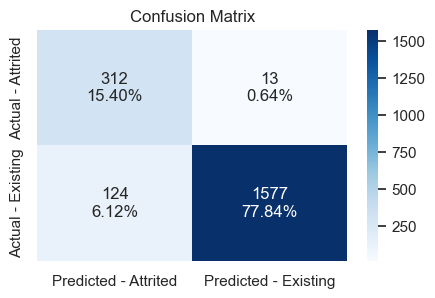

In [83]:
make_confusion_matrix(gbm_tuned_model, X_test, y_test)

### Using Pipeline for Final Model

Now that we have finalized our model, we'll build a model pipeline to streamline all the steps of model building.
We'll start will the initial dataset and proceed with the pipeline building steps.


In [85]:
# The static variables
# Random state and loss
seed = 1
loss_func = "logloss"

# Test and Validation sizes
test_size = 0.2
val_size = 0.25

# Dependent Varibale Value map
target_mapper = {"Attrited Customer": 1, "Existing Customer": 0}

df_pipe = churn_df.copy()
cat_columns = df_pipe.select_dtypes(include="object").columns.tolist()
df_pipe[cat_columns] = df_pipe[cat_columns].astype("category")

In [89]:
df_pipe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   CLIENTNUM                 10127 non-null  int64   
 1   Attrition_Flag            10127 non-null  category
 2   Customer_Age              10127 non-null  int64   
 3   Gender                    10127 non-null  category
 4   Dependent_count           10127 non-null  int64   
 5   Education_Level           8608 non-null   category
 6   Marital_Status            9378 non-null   category
 7   Income_Category           10127 non-null  category
 8   Card_Category             10127 non-null  category
 9   Months_on_book            10127 non-null  int64   
 10  Total_Relationship_Count  10127 non-null  int64   
 11  Months_Inactive_12_mon    10127 non-null  int64   
 12  Contacts_Count_12_mon     10127 non-null  int64   
 13  Credit_Limit              10127 non-null  floa

### Dependent and independent variables

In [86]:
X = df_pipe.drop(columns=["Attrition_Flag"])
y = df_pipe["Attrition_Flag"].map(target_mapper)

### Split data in Train, Validation and Test sets

In [87]:
# Splitting data into training, validation and test set:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=test_size, random_state=seed, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=val_size, random_state=seed, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 20) (2026, 20) (2026, 20)


### Undersampling the training data since that generalized this model really well

In [88]:
under_sample = RandomUnderSampler(random_state=seed)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

### Data processing Steps

In [94]:
# The static variables

# For dropping columns
columns_to_drop = [
    "CLIENTNUM",
    "Credit_Limit",
    "Dependent_count",
    "Months_on_book",
    "Avg_Open_To_Buy",
    "Customer_Age",
]

# For masking a particular value in a feature
column_to_mask_value = "Income_Category"
value_to_mask = "abc"
masked_value = "Unknown"



# One-hot encoding columns
columns_to_encode = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]

# Numerical Columns
num_columns = [
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Total_Revolving_Bal",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]


# Columns for null imputation with Unknown
columns_to_null_imp_unknown = ["Education_Level", "Marital_Status"]

### Build the pipeline

In [95]:
# To Drop unnecessary columns
column_dropper = DropFeatures(variables_to_drop=columns_to_drop)

# To Mask incorrect/meaningless value of a feature
value_masker = CustomValueMasker(
    feature=column_to_mask_value, value_to_mask=value_to_mask, masked_value=masked_value
)

# Missing value imputation
imputer = FillUnknown()

# To encode the categorical data
one_hot = OneHotEncoder(handle_unknown="ignore")

# To scale numerical columns
scaler = RobustScaler()


# creating a transformer for feature name standardization and dropping columns
cleanser = Pipeline(
    steps=[
        ("column_dropper", column_dropper),
        ("value_mask", value_masker),
        ("imputation", imputer),
    ]
)

# creating a transformer for data encoding

encode_transformer = Pipeline(steps=[("onehot", one_hot)])
num_scaler = Pipeline(steps=[("scale", scaler)])

preprocessor = ColumnTransformer(
    transformers=[
        ("encoding", encode_transformer, columns_to_encode),
        ("scaling", num_scaler, num_columns),
    ],
    remainder="passthrough",
)

# Model

gbm_tuned_model = GradientBoostingClassifier(
    n_estimators=700,
    max_features=1.0,
    max_depth=25,
    min_samples_split=2,
    min_samples_leaf=15,
    random_state=seed,
)

# Creating new pipeline with best parameters
model_pipe = Pipeline(
    steps=[
        ("cleanse", cleanser),
        ("preprocess", preprocessor),
        ("model", gbm_tuned_model),
    ]
)
# Fit the model on training data
model_pipe.fit(X_train_un, y_train_un)

Pipeline(steps=[('cleanse',
                 Pipeline(steps=[('column_dropper',
                                  <__main__.DropFeatures object at 0x000002B958D658D0>),
                                 ('value_mask',
                                  <__main__.CustomValueMasker object at 0x000002B95F655650>),
                                 ('imputation',
                                  <__main__.FillUnknown object at 0x000002B95FBBFA10>)])),
                ('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('encoding',
                                                  Pipeline(steps=[('o...
                                                  Pipeline(steps=[('scale',
                                                                   RobustScaler())]),
                                                  ['Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Total_Revolving_Bal',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Total_Trans_Amt',
                                                   'Total_Trans_Ct',
                                                   'Total_Ct_Chng_Q4_Q1',
                                                   'Avg_Utilization_Ratio'])])),
                ('model',
                 GradientBoostingClassifier(max_depth=25, max_features=1.0,
                                            min_samples_leaf=15,
                                            n_estimators=700,
                                            random_state=1))])

### Score the pipeline using test data

### Accuracy

In [96]:
print(
    "Accuracy on Test is: {}%".format(round(model_pipe.score(X_test, y_test) * 100, 0))
)

Accuracy on Test is: 94.0%


### Recall

In [97]:
pred_train_p = model_pipe.predict_proba(X_train_un)[:, 1] > 0.5
pred_test_p = model_pipe.predict_proba(X_test)[:, 1] > 0.5

pred_train_p = np.round(pred_train_p)
pred_test_p = np.round(pred_test_p)

train_acc_p = accuracy_score(pred_train_p, y_train_un)
test_acc_p = accuracy_score(pred_test_p, y_test)

train_recall_p = recall_score(y_train_un, pred_train_p)
test_recall_p = recall_score(y_test, pred_test_p)

In [98]:
print("Recall on Test is: {}%".format(round(test_recall_p * 100, 0)))

Recall on Test is: 96.0%


### Actionable Insights and Recommendations

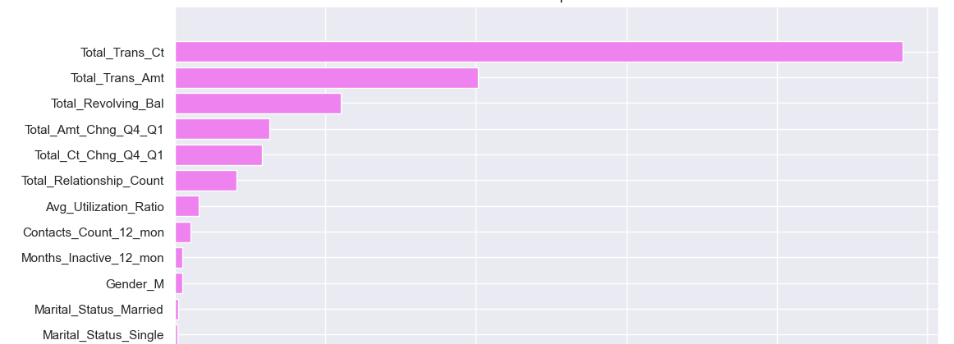

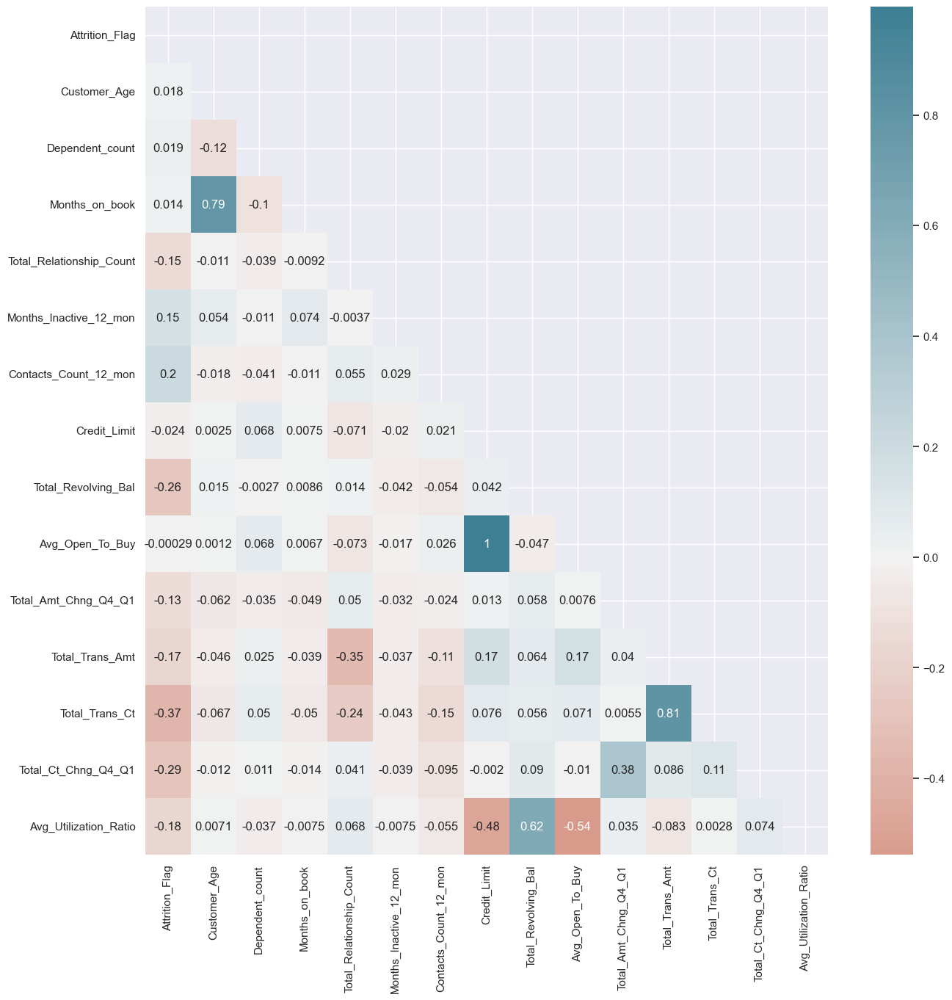

In [104]:
mask = np.zeros_like(data_clean.corr(numeric_only=True), dtype=bool)
mask[np.triu_indices_from(mask)] = True


sns.set(rc={"figure.figsize": (15, 15)})

sns.heatmap(
    data_clean.corr(numeric_only=True),
    cmap=sns.diverging_palette(20, 220, n=200),
    annot=True,
    mask=mask,
    center=0,
)
plt.show()

>- The most important features to understand customer credit card churn, are
> 1. Total Transaction Count
> 2. Total Transaction Amount
> 3. Total Revolving Balance
> 4. Total Amount Change Q4 to Q1
> 5. Total Count Change Q4 to Q1
> 6. Total Relationship Count  
>&nbsp;
>
>- All of these features are negatively correlated with the Attrition Flag, meaning, the lower the values of these features, the higher the chances of a customer to attrite  
>&nbsp;
>
>- Bank should connect with the customer more often to increase the connect, and provide the customer with various offers and schemes to increase relationships of the customer with the bank  
>&nbsp;
>
>- Bank should offer cashback schemes on credit cards, which might encourage the customers on using the credit card more often  
>&nbsp;
>
>- Bank should also offer credit limit increase for the customers who are regularly using the credit card. This should increase the credit card spends/transaction amounts.  
>&nbsp;
>
>- 0% interest EMI on credit card is also another offer that can be provided to customers to encourage the customers buy products of higher cost with credit card, and convert the expenditure to EMI, so that total transaction amount as well as transaction counts would increase. The balance would also revolve nicely.  
>&nbsp;
>
>- Along with the available types of cards, bank can introduce credit cards specific to online shopping (with % cashback offers) or online food ordering. This way the card will be used more frequently.  
>&nbsp;
>
>- With our model, we can predict which customers are likely to attrite, and according to the predicted probability, at least top 20-30% customers can be reached out to discuss credit card offers, credit limit increase etc, to try retain those customers.